### Observations

- Frequency of train and test data is hourly

- train data lies between '2010-03-10  18:00:00' & '2011-01-01  00:00:00' (March '2010 to Dec' 2011 : 10 months)
- test data lies between '2011-01-01  00:00:00', '2011-04-04  14:00:00' (Jan' 2011 to April'11: 3 Months months)

- "2011-01-01  00:00:00" is present in both train and test data
- March and April (part of those) are the only months which is present in train and test data
- Jan and Feb is present in test data, but not in train data

- There are no missing dates. Both in the train and test data, all the hours are present


In [1]:
import sys

import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import statsmodels.tsa.api as tsa

pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

%matplotlib inline

matplotlib.style.use("Solarize_Light2")

sys.path.insert(0, "/opt/vssexclude/personal/kaggle/kaggle_tab_jul")

In [2]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

In [3]:
import src.munging.explore_data_util as explore
import src.munging.process_data_util as process
import src.ts as ts
import src.viz.plot_util as viz
import src.common.com_util as util
import src.config.constants as constants

In [4]:
logger = util.get_logger("main")

DATA_DIR = "/opt/vssexclude/personal/kaggle/kaggle_tab_jul/data/raw"

In [5]:
train_df = pd.read_csv(f"{DATA_DIR}/train.csv", parse_dates=["date_time"])
test_df = pd.read_csv(f"{DATA_DIR}/test.csv", parse_dates=["date_time"])
submission_df = pd.read_csv(f"{DATA_DIR}/sample_submission.csv", parse_dates=["date_time"])

In [6]:
train_df.shape, test_df.shape, submission_df.shape

((7111, 12), (2247, 9), (2247, 4))

In [7]:
train_df.columns

Index(['date_time', 'deg_C', 'relative_humidity', 'absolute_humidity',
       'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5',
       'target_carbon_monoxide', 'target_benzene', 'target_nitrogen_oxides'],
      dtype='object')

In [8]:
train_df = train_df.sort_values(by="date_time")
test_df = test_df.sort_values(by="date_time")

In [9]:
train_df.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,target_carbon_monoxide,target_benzene,target_nitrogen_oxides
0,2010-03-10 18:00:00,13.1,46.0,0.7578,1387.2,1087.8,1056.0,1742.8,1293.4,2.5,12.0,167.7
1,2010-03-10 19:00:00,13.2,45.3,0.7255,1279.1,888.2,1197.5,1449.9,1010.9,2.1,9.9,98.9
2,2010-03-10 20:00:00,12.6,56.2,0.7502,1331.9,929.6,1060.2,1586.1,1117.0,2.2,9.2,127.1
3,2010-03-10 21:00:00,11.0,62.4,0.7867,1321.0,929.0,1102.9,1536.5,1263.2,2.2,9.7,177.2
4,2010-03-10 22:00:00,11.9,59.0,0.7888,1272.0,852.7,1180.9,1415.5,1132.2,1.5,6.4,121.8


### Check the data type

In [10]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7111 entries, 0 to 7110
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date_time               7111 non-null   datetime64[ns]
 1   deg_C                   7111 non-null   float64       
 2   relative_humidity       7111 non-null   float64       
 3   absolute_humidity       7111 non-null   float64       
 4   sensor_1                7111 non-null   float64       
 5   sensor_2                7111 non-null   float64       
 6   sensor_3                7111 non-null   float64       
 7   sensor_4                7111 non-null   float64       
 8   sensor_5                7111 non-null   float64       
 9   target_carbon_monoxide  7111 non-null   float64       
 10  target_benzene          7111 non-null   float64       
 11  target_nitrogen_oxides  7111 non-null   float64       
dtypes: datetime64[ns](1), float64(11)
memory usage: 

In [11]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2247 entries, 0 to 2246
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   date_time          2247 non-null   datetime64[ns]
 1   deg_C              2247 non-null   float64       
 2   relative_humidity  2247 non-null   float64       
 3   absolute_humidity  2247 non-null   float64       
 4   sensor_1           2247 non-null   float64       
 5   sensor_2           2247 non-null   float64       
 6   sensor_3           2247 non-null   float64       
 7   sensor_4           2247 non-null   float64       
 8   sensor_5           2247 non-null   float64       
dtypes: datetime64[ns](1), float64(8)
memory usage: 175.5 KB


In [12]:
submission_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2247 entries, 0 to 2246
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date_time               2247 non-null   datetime64[ns]
 1   target_carbon_monoxide  2247 non-null   float64       
 2   target_benzene          2247 non-null   float64       
 3   target_nitrogen_oxides  2247 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 70.3 KB


### Explore Train Data

In [13]:
submission_df.head().values

array([[Timestamp('2011-01-01 00:00:00'), 2.0, 10.0, 300.0],
       [Timestamp('2011-01-01 01:00:00'), 2.0, 10.0, 300.0],
       [Timestamp('2011-01-01 02:00:00'), 2.0, 10.0, 300.0],
       [Timestamp('2011-01-01 03:00:00'), 2.0, 10.0, 300.0],
       [Timestamp('2011-01-01 04:00:00'), 2.0, 10.0, 300.0]], dtype=object)

In [14]:
test_df.head()

,date_time,deg_C,relative_humidity,absolute_humidity,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5
0,2011-01-01 00:00:00,8.0,41.3,0.4375,1108.8,745.7,797.1,880.0,1273.1
1,2011-01-01 01:00:00,5.1,51.7,0.4564,1249.5,864.9,687.9,972.8,1714.0
2,2011-01-01 02:00:00,5.8,51.5,0.4689,1102.6,878.0,693.7,941.9,1300.8
3,2011-01-01 03:00:00,5.0,52.3,0.4693,1139.7,916.2,725.6,1011.0,1283.0
4,2011-01-01 04:00:00,4.5,57.5,0.4650,1022.4,838.5,871.5,967.0,1142.3


In [15]:
submission_df.head()

,date_time,target_carbon_monoxide,target_benzene,target_nitrogen_oxides
0,2011-01-01 00:00:00,2.0,10.0,300.0
1,2011-01-01 01:00:00,2.0,10.0,300.0
2,2011-01-01 02:00:00,2.0,10.0,300.0
3,2011-01-01 03:00:00,2.0,10.0,300.0
4,2011-01-01 04:00:00,2.0,10.0,300.0


- Frequency of train and test data is hourly

#### Start and End date of train & test data

In [16]:
start_train_date, end_train_date = ts.get_start_end_date(df=train_df, feature="date_time", format="%Y-%m-%d  %H:%M:%S")
start_train_date, end_train_date

('2010-03-10  18:00:00', '2011-01-01  00:00:00')

In [17]:
start_test_date, end_test_date = ts.get_start_end_date(df=test_df, feature="date_time", format="%Y-%m-%d  %H:%M:%S")
start_test_date, end_test_date

('2011-01-01  00:00:00', '2011-04-04  14:00:00')

- "2011-01-01  00:00:00" is present in both train and test data
- March and April (part of those) are the only months which is present in train and test data
- Jan and Feb is present in test data, but not in train data

### Are there any missing dates?

In [18]:
ts.find_missing_dates(train_df.date_time, start_train_date, end_train_date)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

In [19]:
ts.find_missing_dates(test_df.date_time, start_test_date, end_test_date)

DatetimeIndex([], dtype='datetime64[ns]', freq=None)

##### Observation
- Both in the train and test data, all the hours are present

### Plot the predictor varaibles for the train and test data

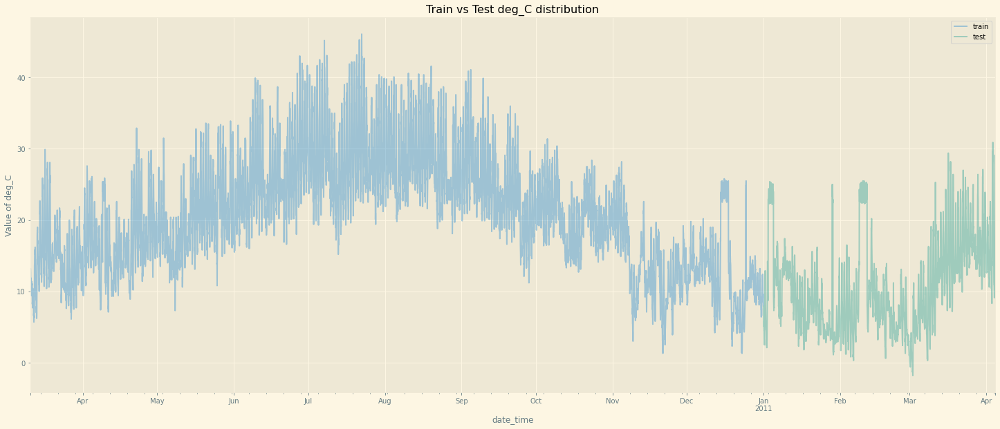

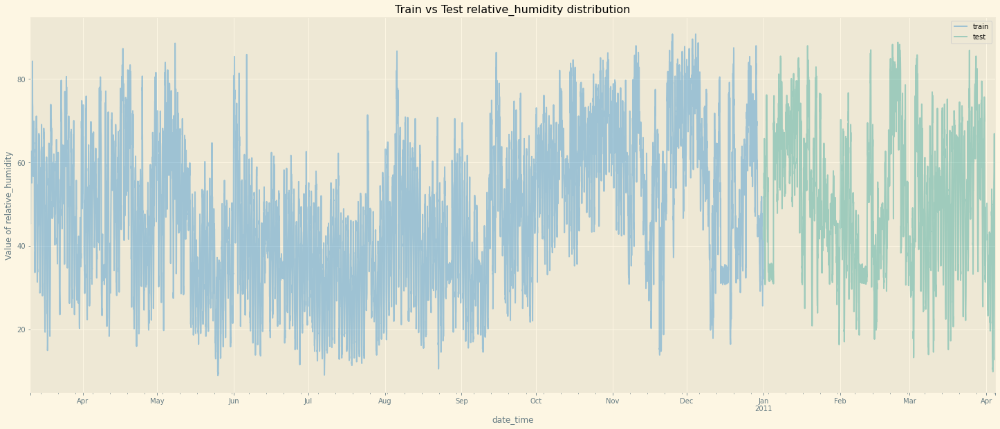

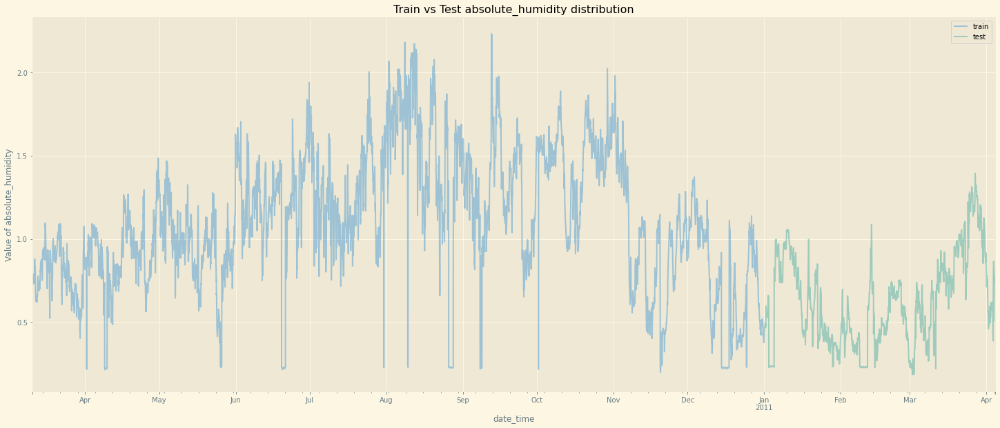

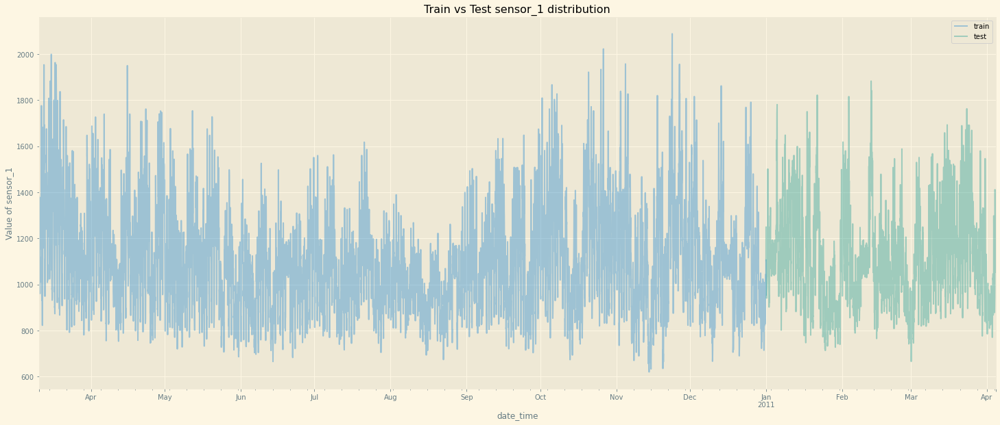

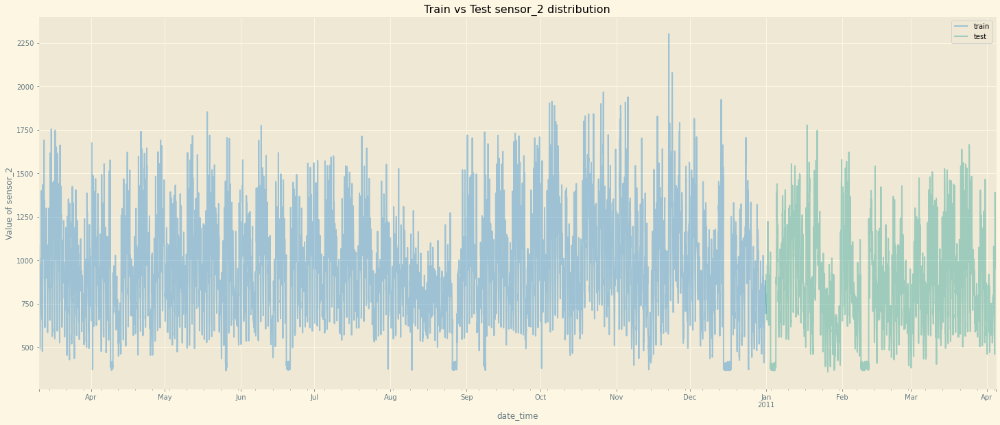

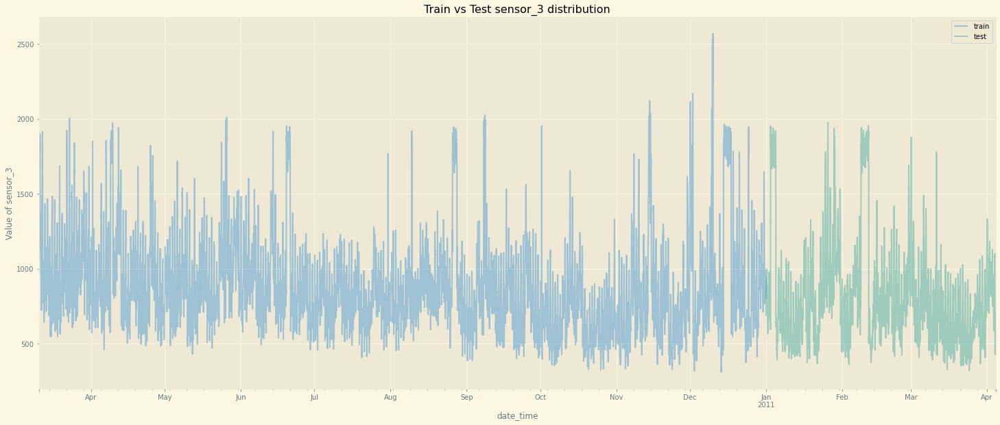

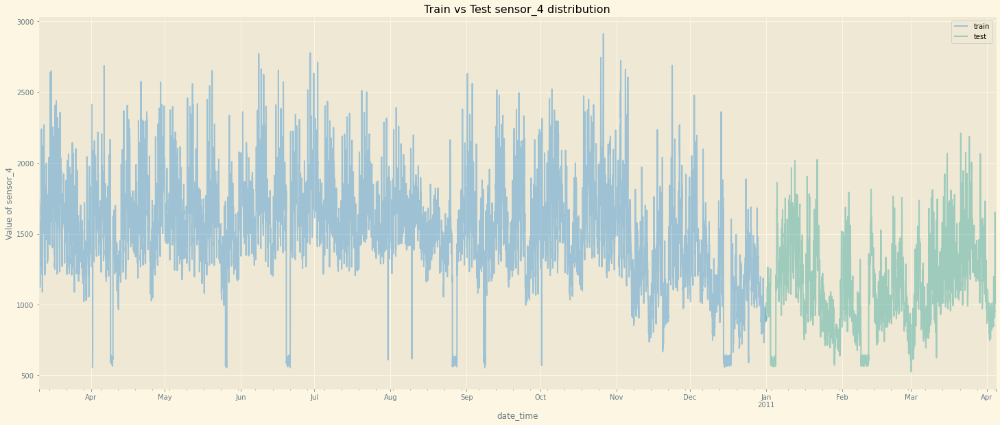

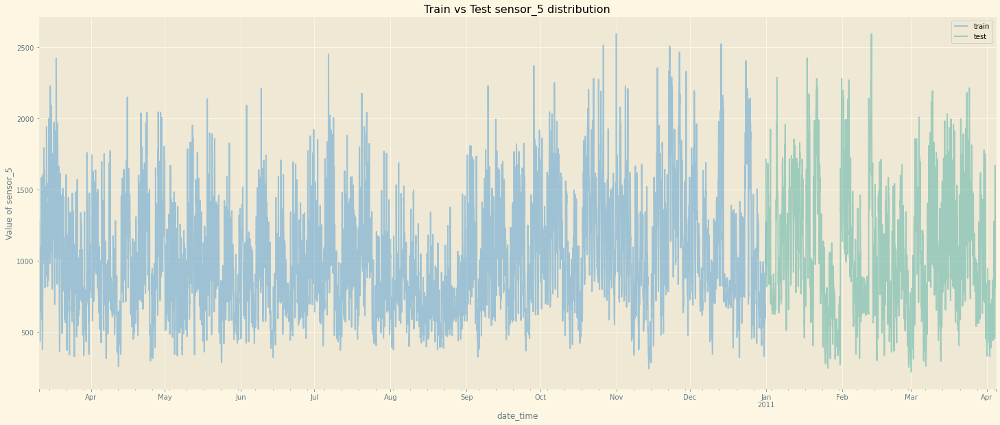

In [20]:
features_to_plot = test_df.columns.drop(['date_time'])
for name in features_to_plot:
    viz.plot_line_train_test_overlapping(train_df.set_index("date_time"), test_df.set_index("date_time"), name, figsize=(25, 10))

### Plot the target variables

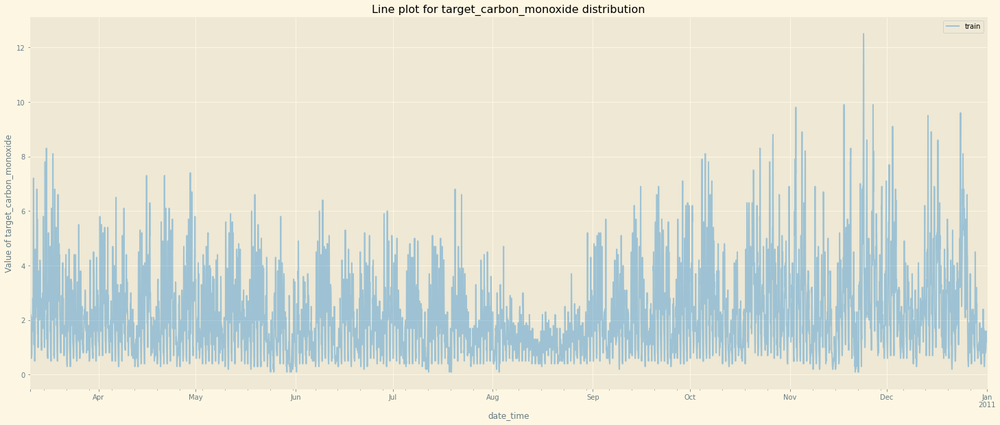

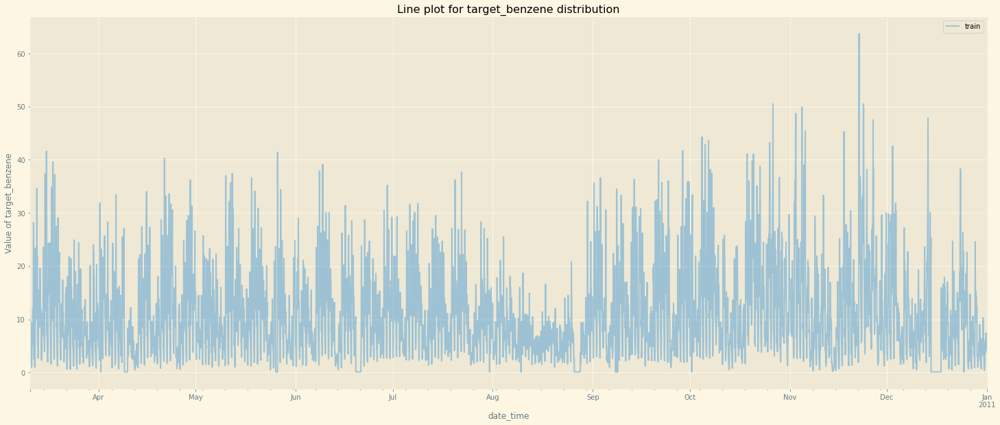

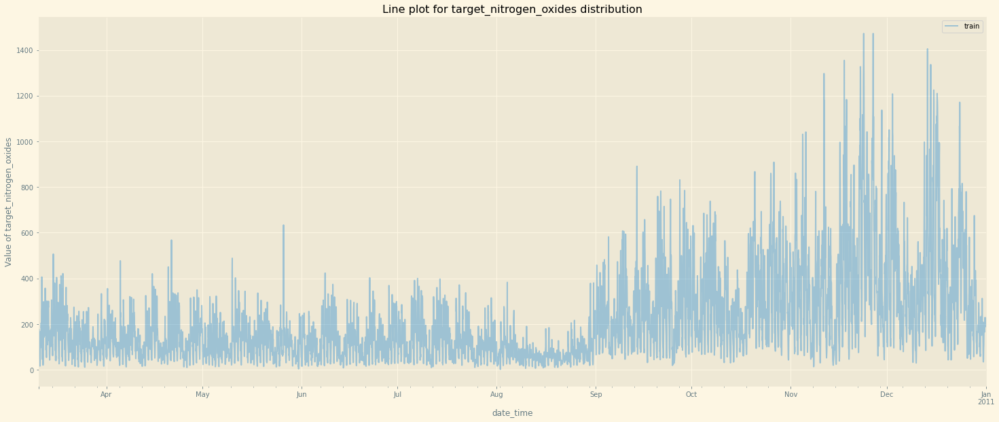

In [21]:
targets = train_df.columns.drop(test_df.columns)

for name in targets:
    viz.plot_line(train_df.set_index("date_time"), name, figsize=(25, 10))

In [22]:
train_df = ts.create_date_features(train_df, train_df, "date_time")
test_df = ts.create_date_features(test_df, test_df, "date_time")

combined_df = pd.concat([train_df.drop(targets, axis=1), test_df])

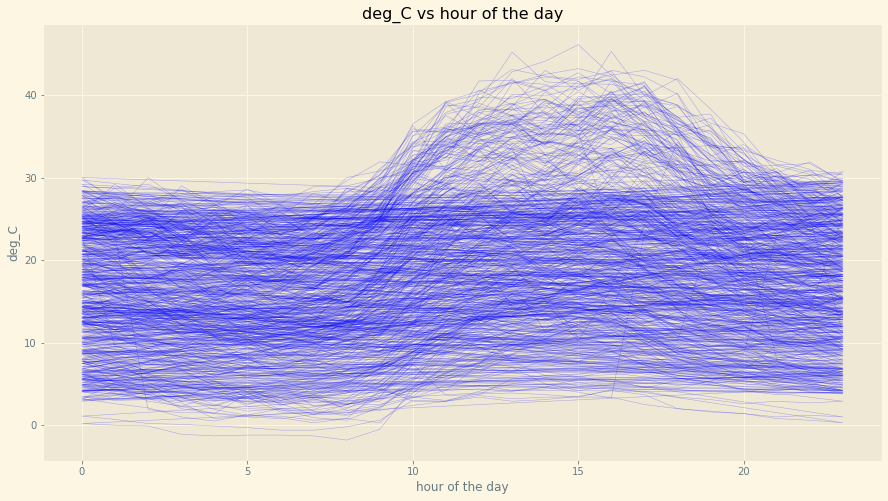

In [23]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="deg_C",
    title="deg_C vs hour of the day",
    xlabel="hour of the day",
    ylabel="deg_C"
)

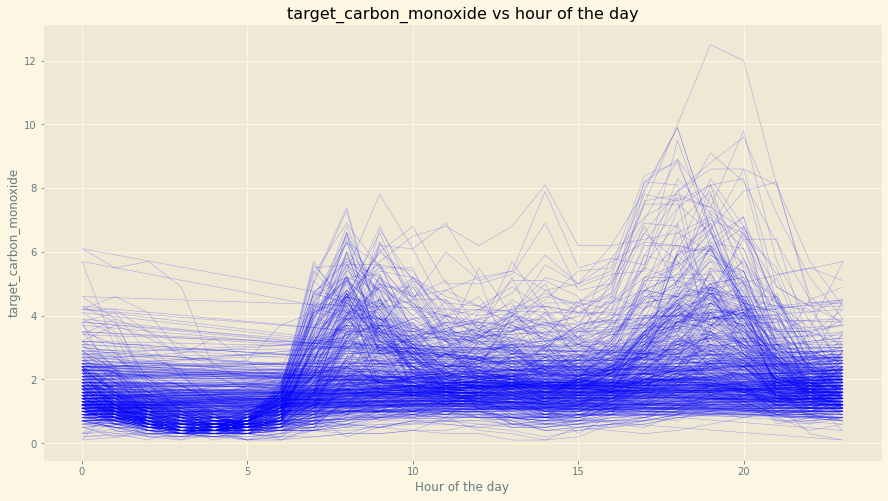

In [24]:
viz.plot_ts_line_groupby(
    train_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="target_carbon_monoxide",
    title="target_carbon_monoxide vs hour of the day",
    xlabel="Hour of the day",
    ylabel="target_carbon_monoxide"
)

- target_carbon_monoxide has a strong dependency on hour of the day.
- During the early morning hours, it's value is lesser.
- The value starts increasing 6 AM onwards.
- There are two sharp, well defined peaks (around 8 AM & 6PM). This is the time when people usually travel to and from office.

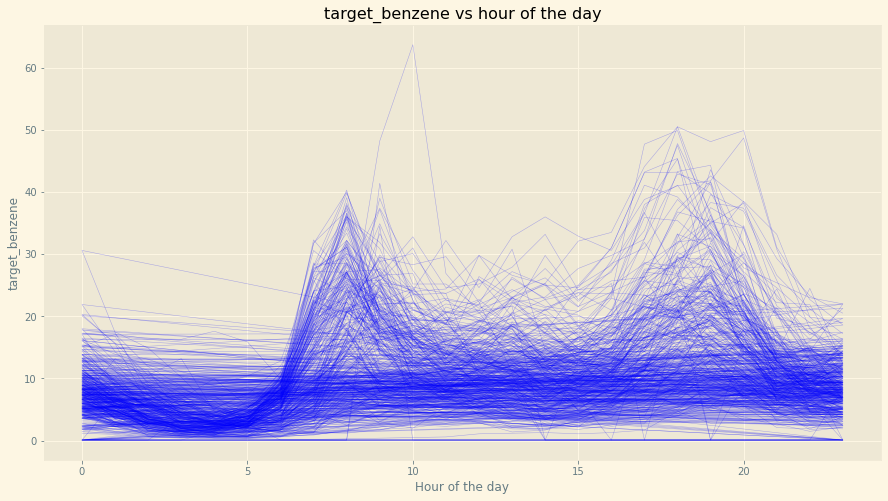

In [25]:
viz.plot_ts_line_groupby(
    train_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="target_benzene",
    title="target_benzene vs hour of the day",
    xlabel="Hour of the day",
    ylabel="target_benzene"
)

- target_benzene's behavior is similar to target_carbon_monoxide:

- Strong dependency on hour of the day.
- During the early morning hours, it's value is lesser.
- The value starts increasing 6 AM onwards.
- There are two peaks (around 8 AM & 6 PM). This is the time when people usually travel to and from office.

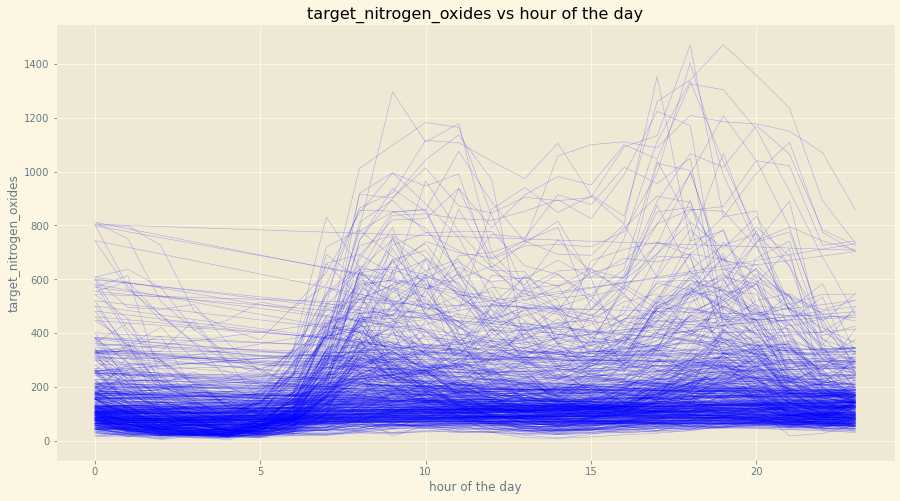

In [26]:
viz.plot_ts_line_groupby(
    train_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="target_nitrogen_oxides",
    title="target_nitrogen_oxides vs hour of the day",
    xlabel="hour of the day",
    ylabel="target_nitrogen_oxides"
)

- target_nitrogen_oxides indicates higher values during the day time compared to night/early morning.
- The peaks are not that prominent here (unlike target_benzene and target_carbon_monoxide).
- Also the peaks during office hours are little spread out (diffused).

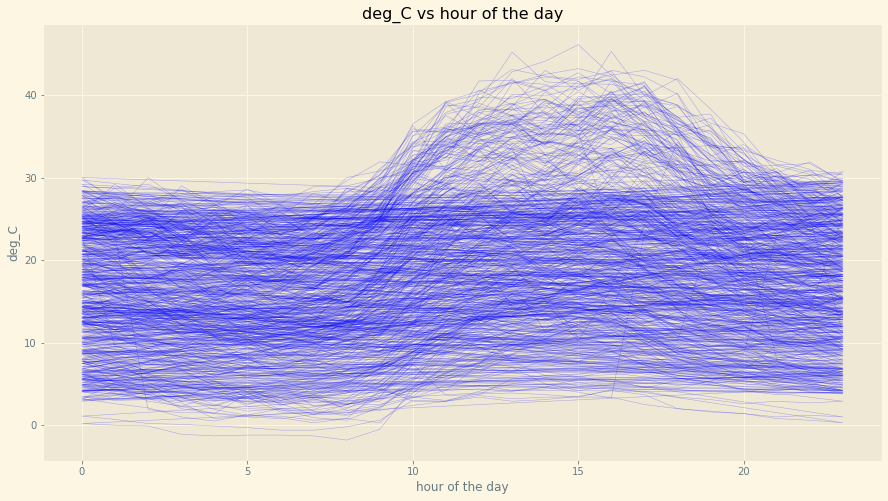

In [27]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="deg_C",
    title="deg_C vs hour of the day",
    xlabel="hour of the day",
    ylabel="deg_C"
)

Temperature of the day is of course dependent with hour of the day. No surprise here.

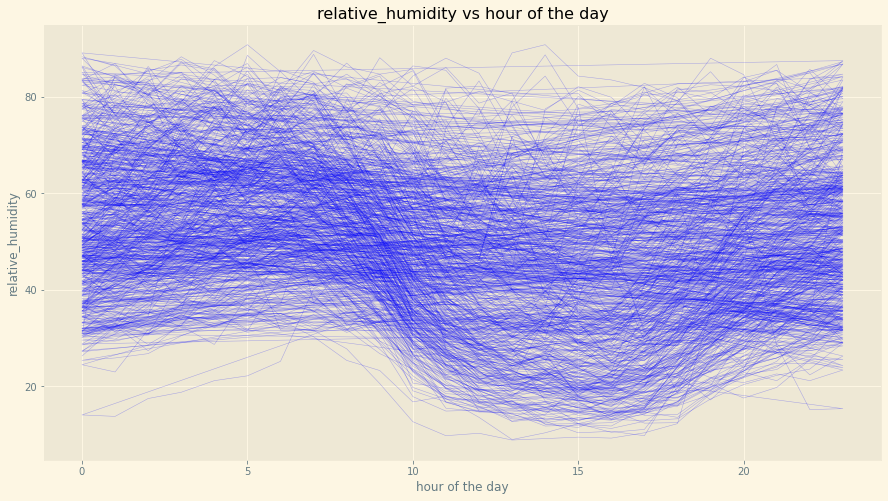

In [28]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="relative_humidity",
    title="relative_humidity vs hour of the day",
    xlabel="hour of the day",
    ylabel="relative_humidity"
)

relative_humidity has a dependency with hour of the day. The value drops during the day

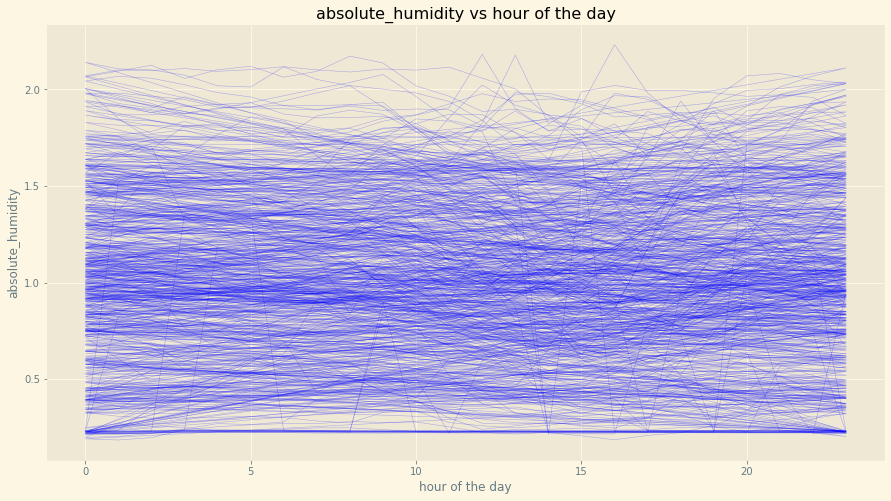

In [29]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="absolute_humidity",
    title="absolute_humidity vs hour of the day",
    xlabel="hour of the day",
    ylabel="absolute_humidity"
)

absolute_humidity doesn't show any dependency with the hour of the day. It seems the values are spread out through out the day.

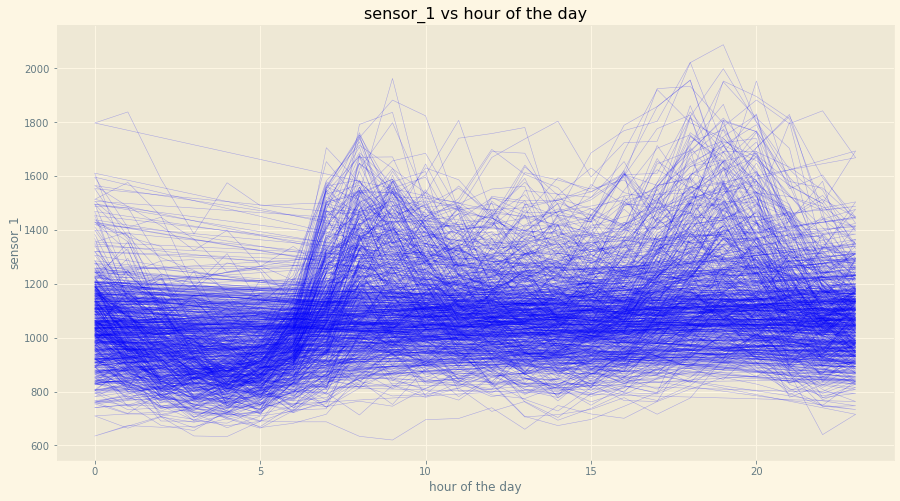

In [30]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="sensor_1",
    title="sensor_1 vs hour of the day",
    xlabel="hour of the day",
    ylabel="sensor_1"
)

- Sensor_1 has strong dependency with 2 peaks (one in the morning and one in the evening)
- Value dips during the early morning and increases during the day time

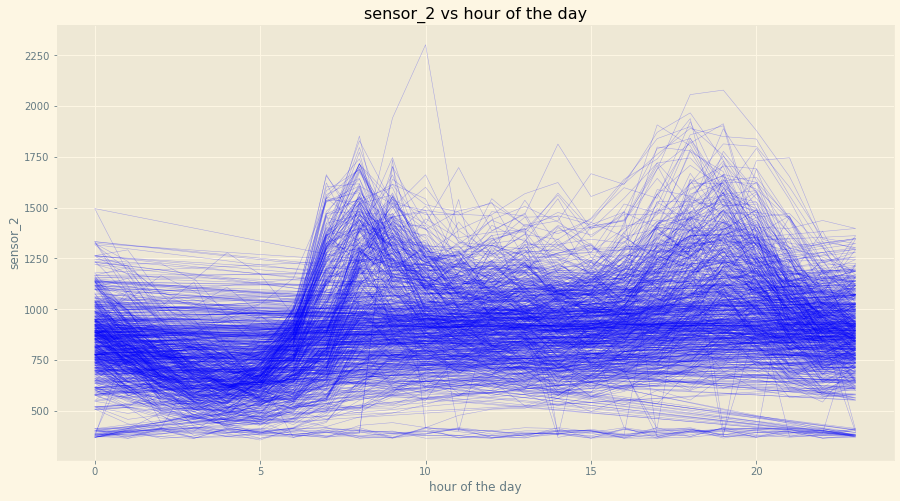

In [31]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="sensor_2",
    title="sensor_2 vs hour of the day",
    xlabel="hour of the day",
    ylabel="sensor_2"
)

- Sensor_1 has strong dependency with 2 peaks (one in the morning and one in the evening)
- Value dips during the early morning and increases during the day time
- The dip in the value during the early morning seems to be higher compared to sensor 1.

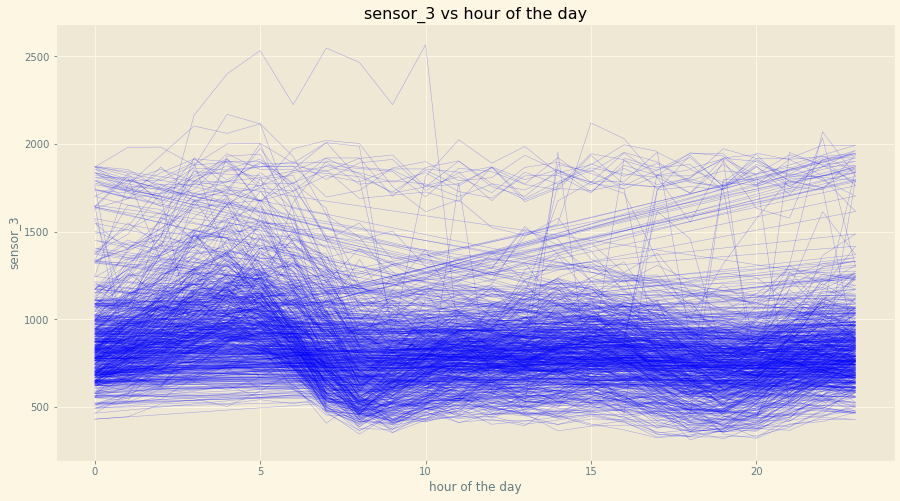

In [32]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="sensor_3",
    title="sensor_3 vs hour of the day",
    xlabel="hour of the day",
    ylabel="sensor_3"
)

- Sensor_3 has strong dependency with 2 downward peaks (one in the morning and one in the evening)
- Value increases during the late night/early morning and decreases during the day time

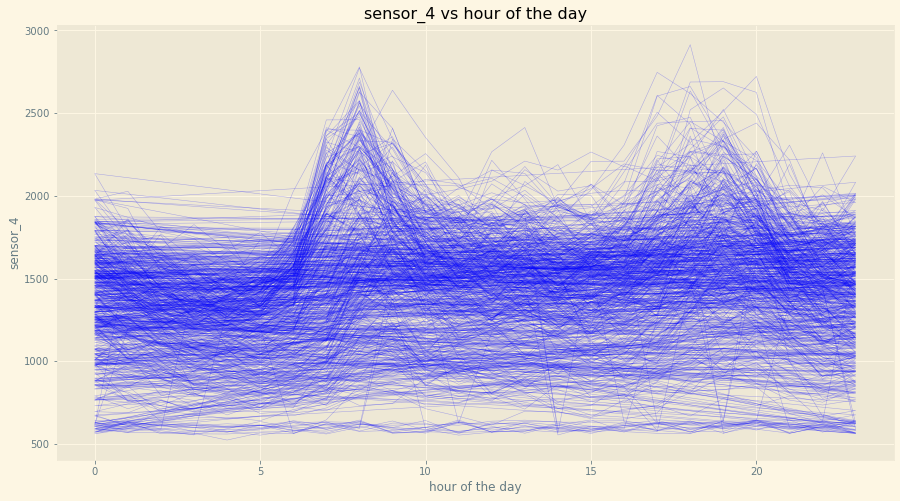

In [33]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="sensor_4",
    title="sensor_4 vs hour of the day",
    xlabel="hour of the day",
    ylabel="sensor_4"
)

For sensor_5, the plot looks similar to sensor 1 and 2. Strong dependency on hours. Two sharp, well defined peaks.

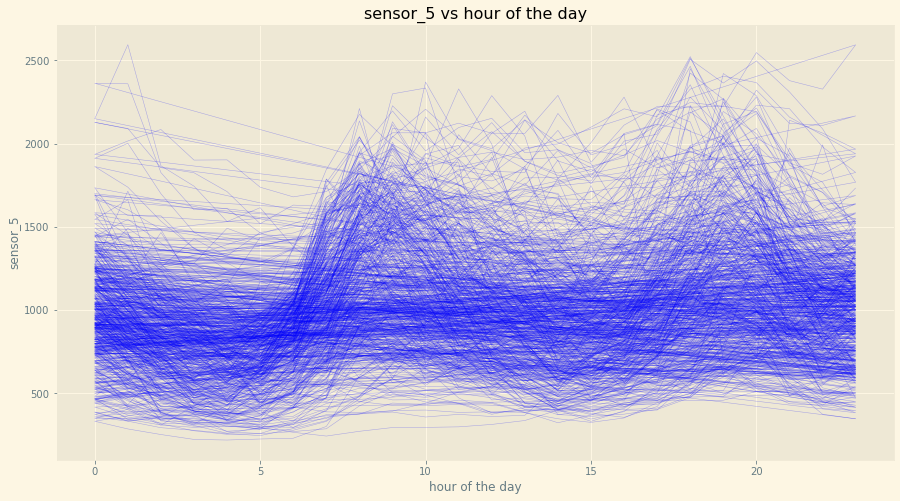

In [34]:
viz.plot_ts_line_groupby(
    combined_df, 
    ts_index_feature="hour",
    groupby_feature="day",
    value_feature="sensor_5",
    title="sensor_5 vs hour of the day",
    xlabel="hour of the day",
    ylabel="sensor_5"
)

For sensor_5, the plot looks similar to sensor 1 and 2. Strong dependency on hours. Two sharp, well defined peaks.

### Decomposition of data into trend, seasonality and residue

#### Decompose carbon_monoxide with daily frequency

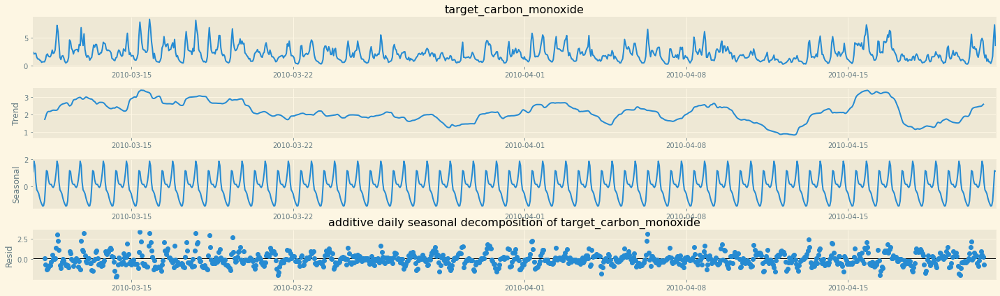

In [35]:
viz.plot_seasonal_decomposition(train_df.set_index("date_time")[0:1000], feature="target_carbon_monoxide", freq=24, freq_type="daily", figsize=(20, 6), model="additive")

#### Plot daily seasonality 

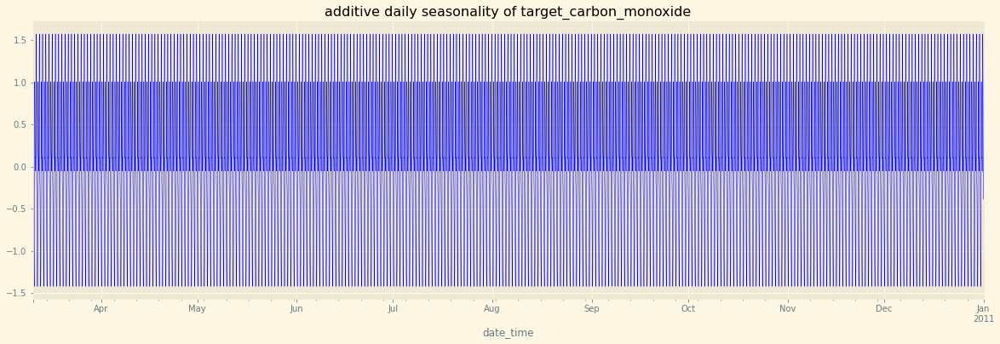

In [36]:
viz.plot_seasonality(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24, freq_type="daily", figsize=(20, 6), model="additive")

Let's zoom into it to understand the pattern

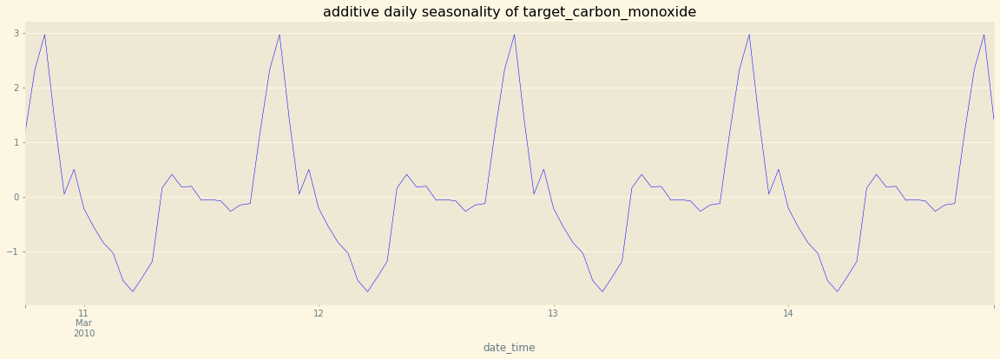

In [37]:
viz.plot_seasonality(train_df.set_index("date_time")[0:100], feature="target_carbon_monoxide", freq=24, freq_type="daily", figsize=(20, 6), model="additive")

#### Let's check if there is any weekly seasonality

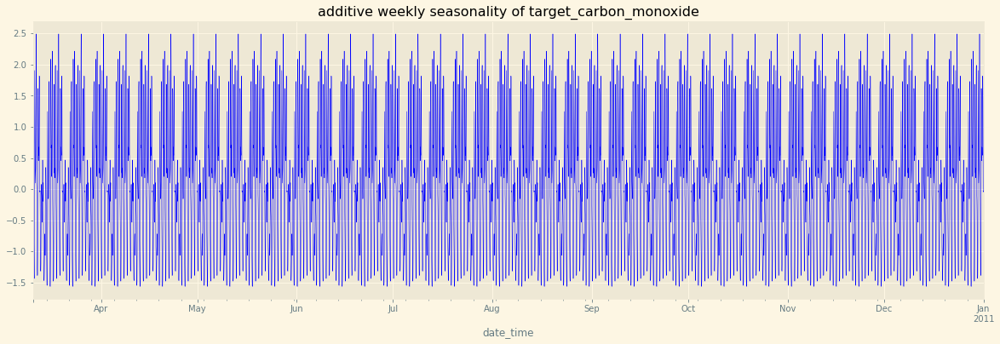

In [38]:
viz.plot_seasonality(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24*7, freq_type="weekly", figsize=(20, 6), model="additive")

Zoom In...

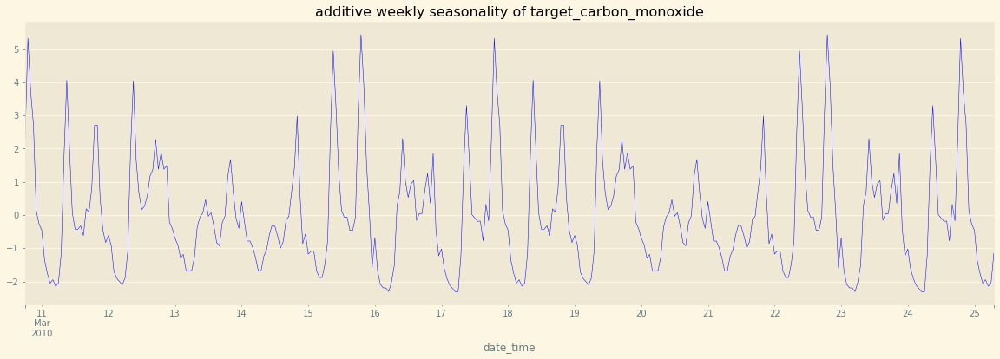

In [39]:
viz.plot_seasonality(train_df.set_index("date_time")[0:350], feature="target_carbon_monoxide", freq=24*7, freq_type="weekly", figsize=(20, 6), model="additive")

#### Let's check if there is any seasonality at the monthly level

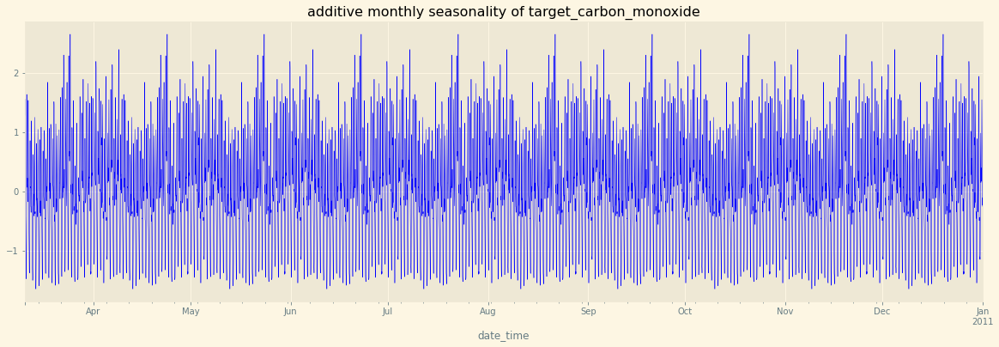

In [40]:
viz.plot_seasonality(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24*30, freq_type="monthly", figsize=(20, 6), model="additive")

Zoom In...

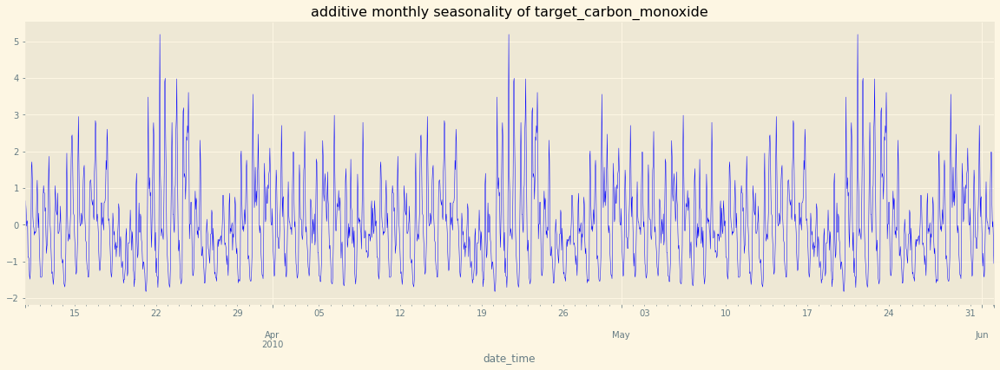

In [41]:
viz.plot_seasonality(train_df.set_index("date_time")[0:2000], feature="target_carbon_monoxide", freq=24*30, freq_type="monthly", figsize=(20, 6), model="additive")

#### Let's check if there is any seasonality at the quareterly level

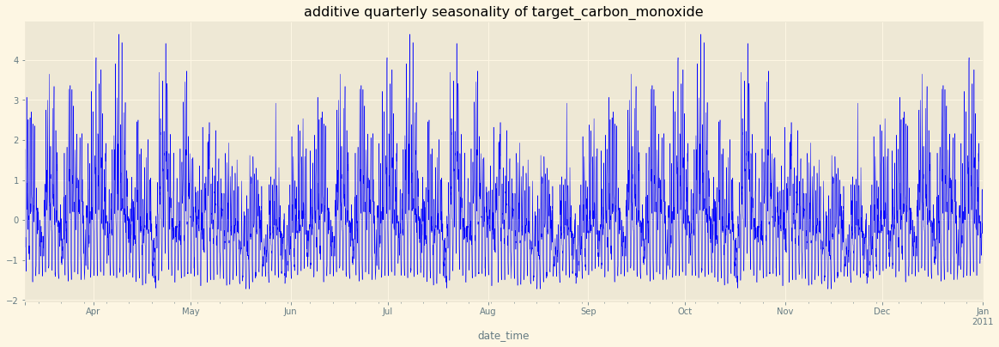

In [42]:
viz.plot_seasonality(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24*90, freq_type="quarterly", figsize=(20, 6), model="additive")

Zoom In..

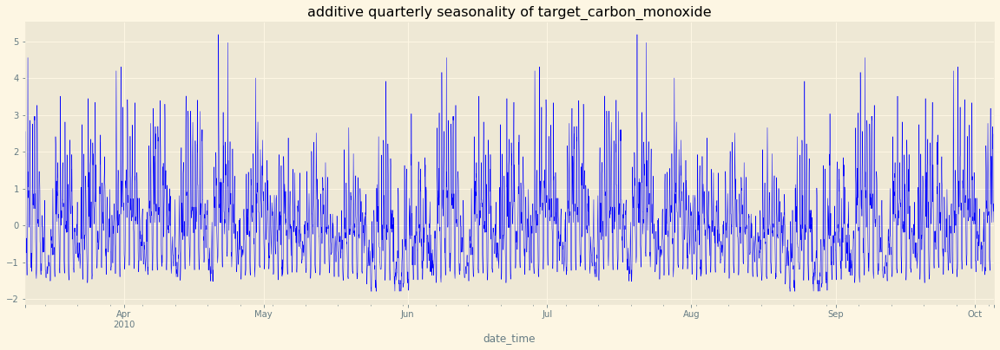

In [43]:
viz.plot_seasonality(train_df.set_index("date_time")[0:5000], feature="target_carbon_monoxide", freq=24*90, freq_type="quarterly", figsize=(20, 6), model="additive")

# Plot Trend

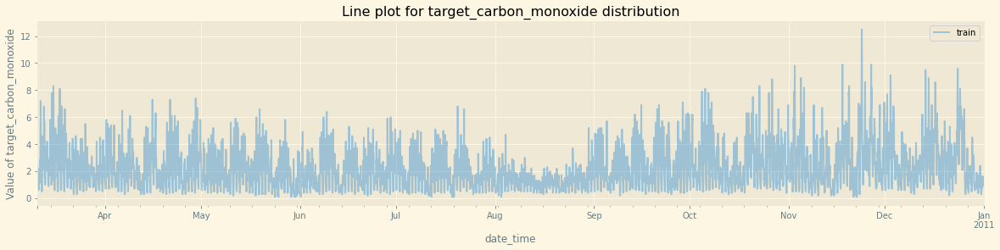

In [44]:
viz.plot_line(df=train_df.set_index("date_time"), feature_name="target_carbon_monoxide", figsize=(20, 4))

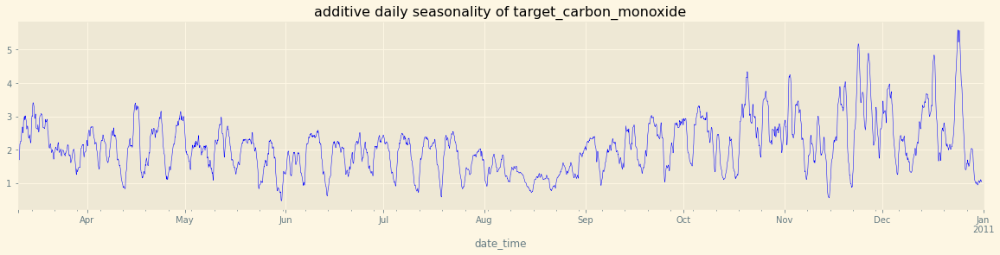

In [45]:
viz.plot_trend(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24, freq_type="daily", figsize=(20, 4), model="additive")

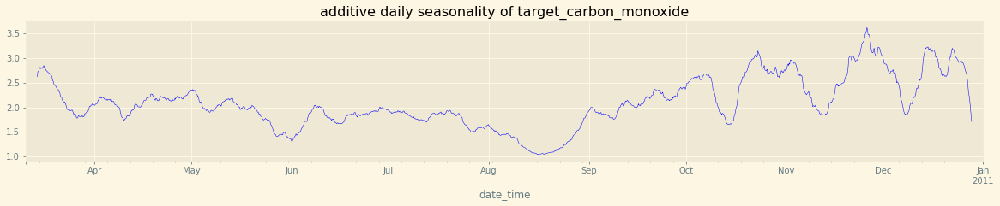

In [46]:
viz.plot_trend(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24*7, freq_type="daily", figsize=(20, 3), model="additive")

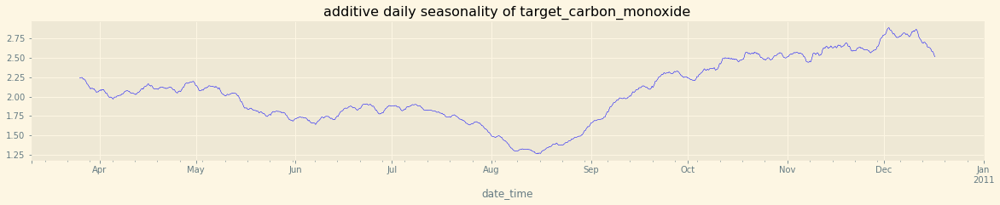

In [47]:
viz.plot_trend(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24*30, freq_type="daily", figsize=(20, 3), model="additive")

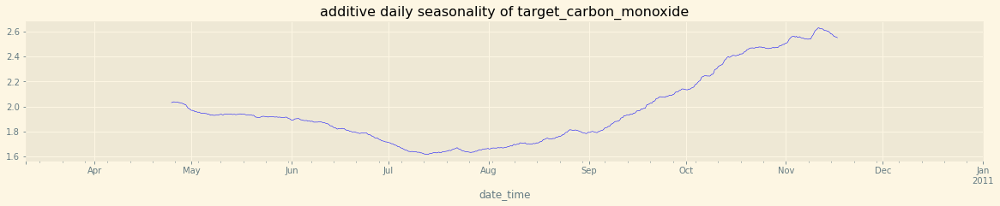

In [48]:
viz.plot_trend(train_df.set_index("date_time"), feature="target_carbon_monoxide", freq=24*30*3, freq_type="daily", figsize=(20, 3), model="additive")

## Understanding Trend using Rolling Window

- Looks like rolling window helps in understanding the overall trend of the data
- For example, average over 30 day rolling window shows that the temperature rises to the top in August and then comes down slowly

In [49]:
combined_df_rolling_daily_mean = combined_df.set_index("date_time").rolling(window="1d", min_periods=24).mean()
combined_df_rolling_7d_mean = combined_df.set_index("date_time").rolling(window="7d", min_periods=24).mean()
combined_df_rolling_15d_mean = combined_df.set_index("date_time").rolling(window="15d", min_periods=24).mean()
combined_df_rolling_30d_mean = combined_df.set_index("date_time").rolling(window="30d", min_periods=24).mean()

train_df_rolling_daily_mean = train_df.set_index("date_time").rolling(window="1d", min_periods=24).mean()
train_df_rolling_7d_mean = train_df.set_index("date_time").rolling(window="7d", min_periods=24).mean()
train_df_rolling_15d_mean = train_df.set_index("date_time").rolling(window="15d", min_periods=24).mean()
train_df_rolling_30d_mean = train_df.set_index("date_time").rolling(window="30d", min_periods=24).mean()

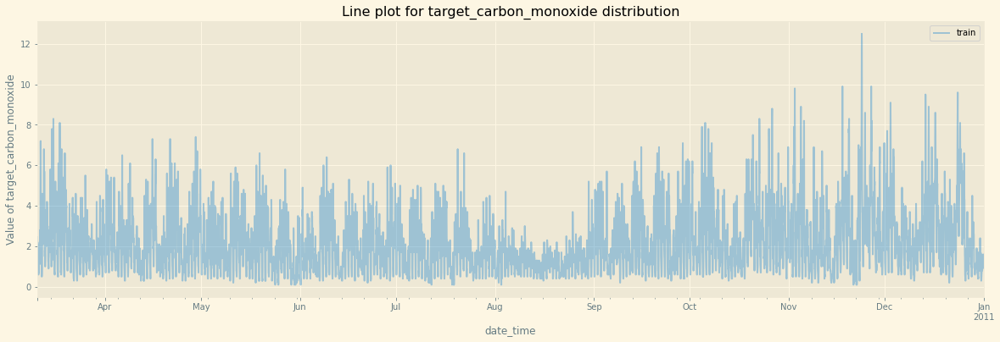

In [50]:
viz.plot_line(train_df.set_index("date_time"), feature_name="target_carbon_monoxide", figsize=(20, 6))

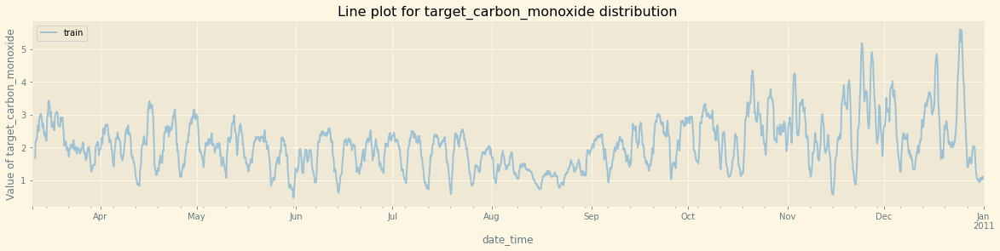

In [51]:
viz.plot_line(train_df_rolling_daily_mean, feature_name="target_carbon_monoxide", figsize=(20, 4))

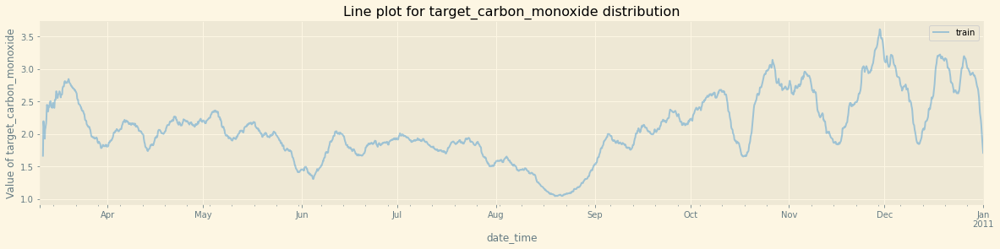

In [52]:
viz.plot_line(train_df_rolling_7d_mean, feature_name="target_carbon_monoxide", figsize=(20, 4))

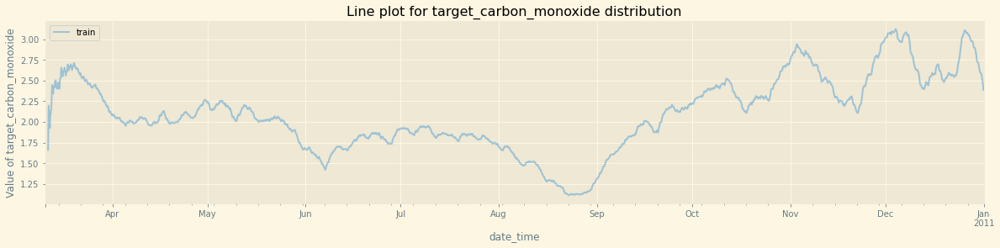

In [53]:
viz.plot_line(train_df_rolling_15d_mean, feature_name="target_carbon_monoxide", figsize=(20, 4))

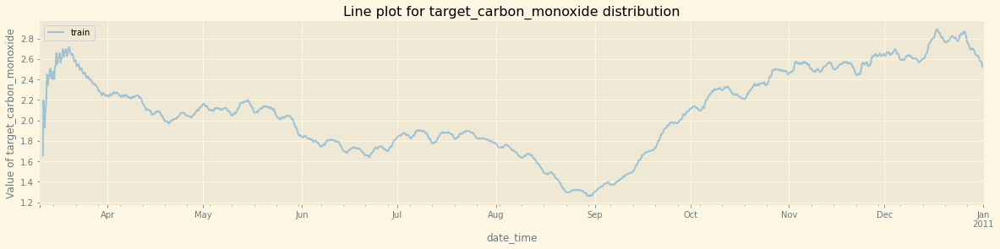

In [54]:
viz.plot_line(train_df_rolling_30d_mean, feature_name="target_carbon_monoxide", figsize=(20, 4))

# Try to understand the trend with Resampling Technique

- This is not creating a smoother plot. Rolling window is better

In [55]:
combined_df_resample_1d = combined_df.set_index("date_time").resample("1d").mean()
combined_df_resample_7d = combined_df.set_index("date_time").resample("7d").mean()
combined_df_resample_15d = combined_df.set_index("date_time").resample("15d").mean()

train_df_resample_1d = train_df.set_index("date_time").resample("1d").mean()
train_df_resample_7d = train_df.set_index("date_time").resample("7d").mean()
train_df_resample_15d = train_df.set_index("date_time").resample("15d").mean()

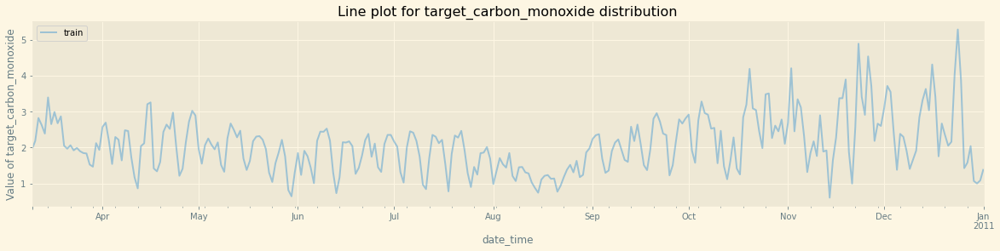

In [56]:
viz.plot_line(train_df_resample_1d, feature_name="target_carbon_monoxide", figsize=(20, 4))

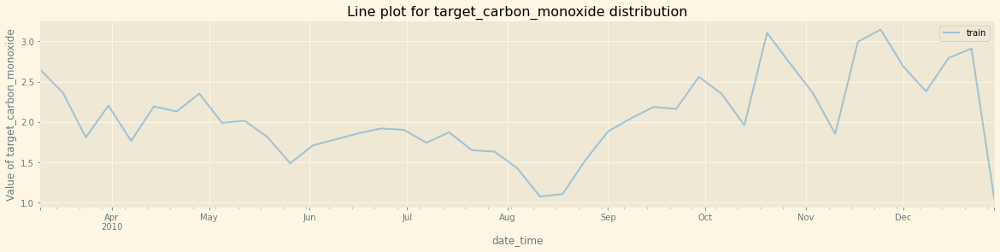

In [57]:
viz.plot_line(train_df_resample_7d, feature_name="target_carbon_monoxide", figsize=(20, 4))

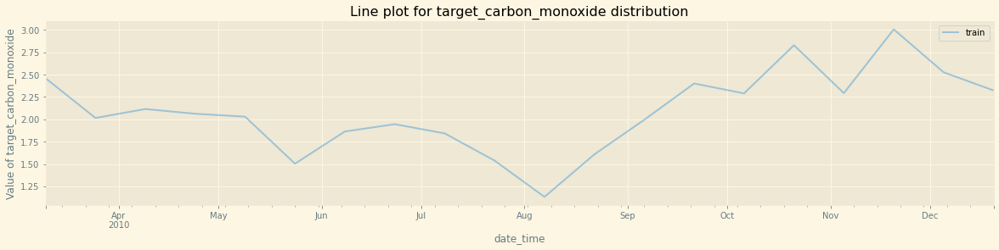

In [58]:
viz.plot_line(train_df_resample_15d, feature_name="target_carbon_monoxide", figsize=(20, 4))

## Below I am trying to understand seasonality without statistics (Unsuccessful Attempt)

In [59]:
combined_df = ts.create_date_features(combined_df, combined_df, "date_time")

combined_df_resample_1d = combined_df.set_index("date_time").resample("1d").mean()
combined_df_resample_1d = combined_df_resample_1d.reset_index()
combined_df_resample_1d = ts.create_date_features(source_df=combined_df_resample_1d, target_df=combined_df_resample_1d, feature_name="date_time")

train_df_resample_1d = train_df.set_index("date_time").resample("1d").mean()
train_df_resample_1d = train_df_resample_1d.reset_index()
train_df_resample_1d = ts.create_date_features(source_df=train_df_resample_1d, target_df=train_df_resample_1d, feature_name="date_time")

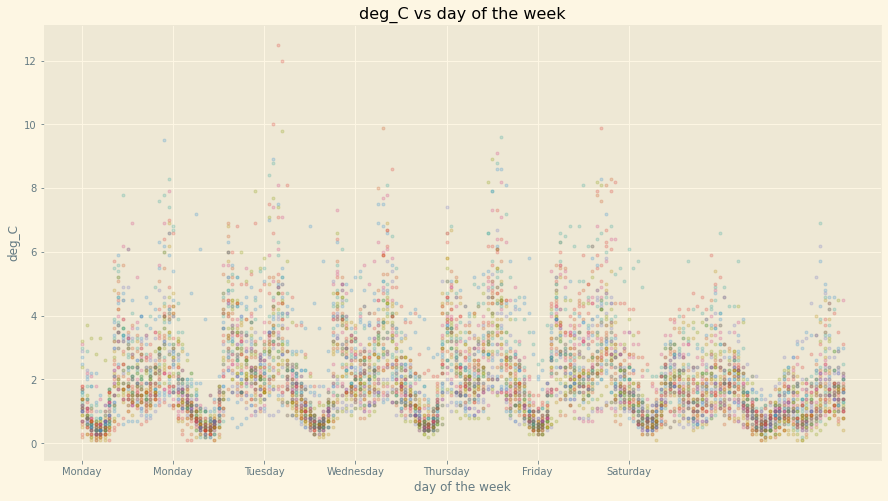

In [60]:
viz.plot_ts_point_groupby(
    train_df, 
    ts_index_feature="day_name",
    groupby_feature="weekofyear",
    value_feature="target_carbon_monoxide",
    title="deg_C vs day of the week",
    xlabel="day of the week",
    ylabel="deg_C"
)

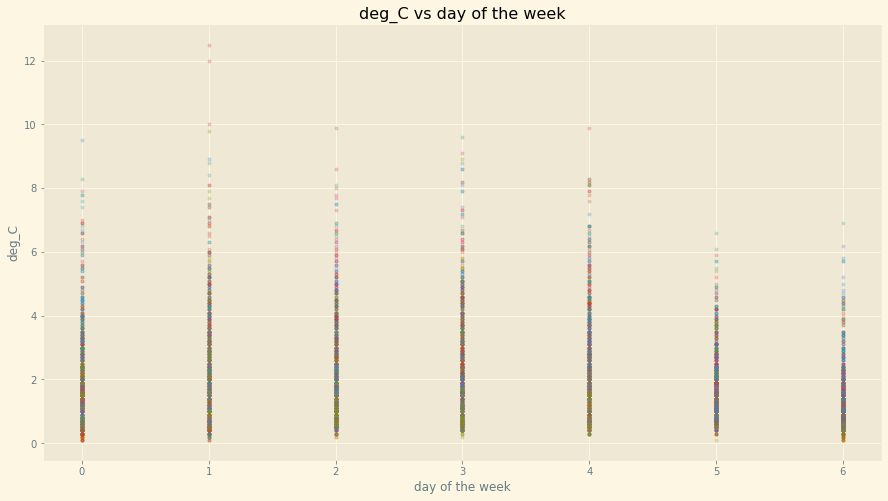

In [61]:
viz.plot_ts_point_groupby(
    train_df, 
    ts_index_feature="dayofweek",
    groupby_feature="weekofyear",
    value_feature="target_carbon_monoxide",
    title="deg_C vs day of the week",
    xlabel="day of the week",
    ylabel="deg_C"
)

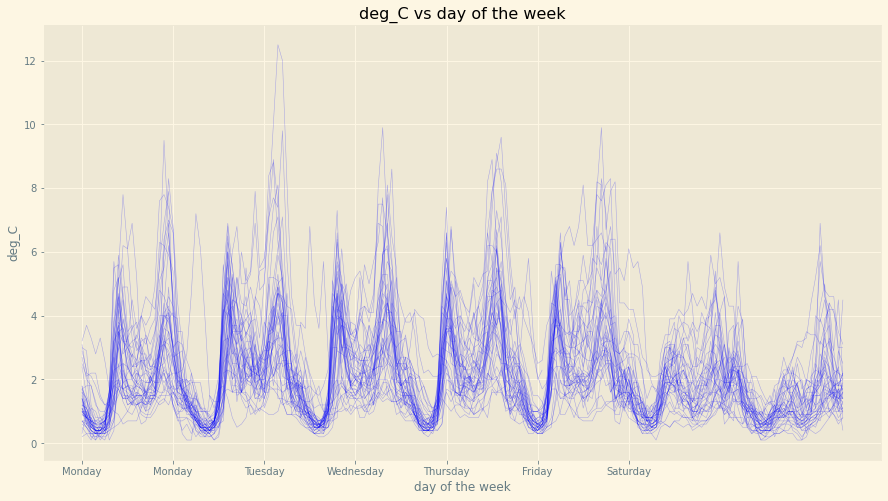

In [62]:
viz.plot_ts_line_groupby(
    train_df, 
    ts_index_feature="day_name",
    groupby_feature="weekofyear",
    value_feature="target_carbon_monoxide",
    title="deg_C vs day of the week",
    xlabel="day of the week",
    ylabel="deg_C"
)

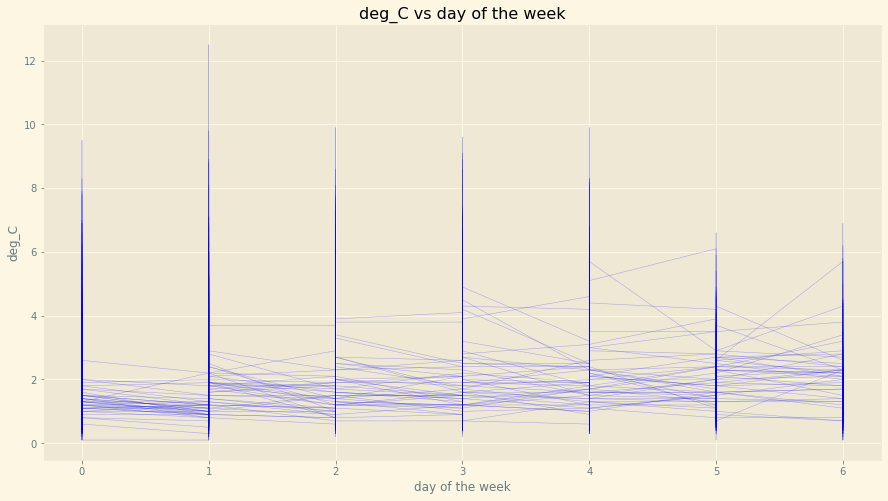

In [63]:
viz.plot_ts_line_groupby(
    train_df, 
    ts_index_feature="dayofweek",
    groupby_feature="weekofyear",
    value_feature="target_carbon_monoxide",
    title="deg_C vs day of the week",
    xlabel="day of the week",
    ylabel="deg_C"
)

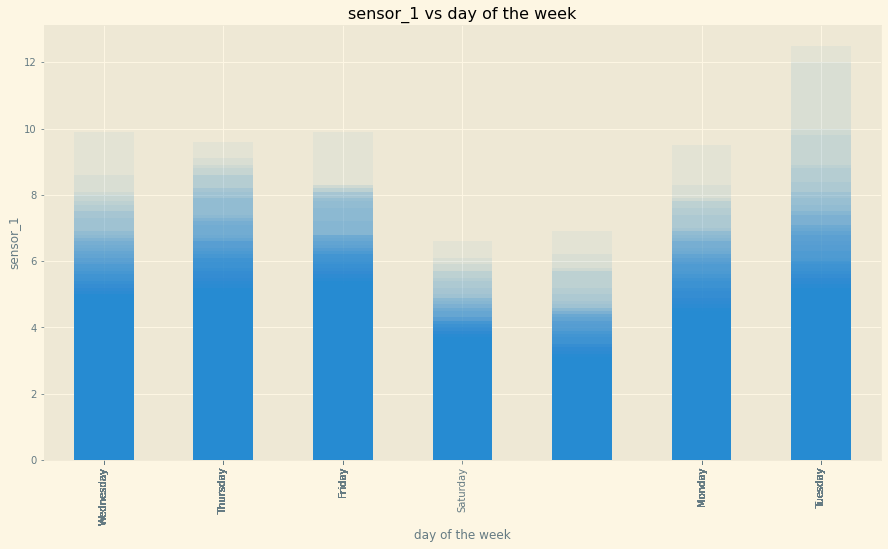

In [64]:
viz.plot_ts_bar_groupby(
    train_df, 
    ts_index_feature="day_name",
    groupby_feature="weekofyear",
    value_feature="target_carbon_monoxide",
    title="sensor_1 vs day of the week",
    xlabel="day of the week",
    ylabel="sensor_1"
)

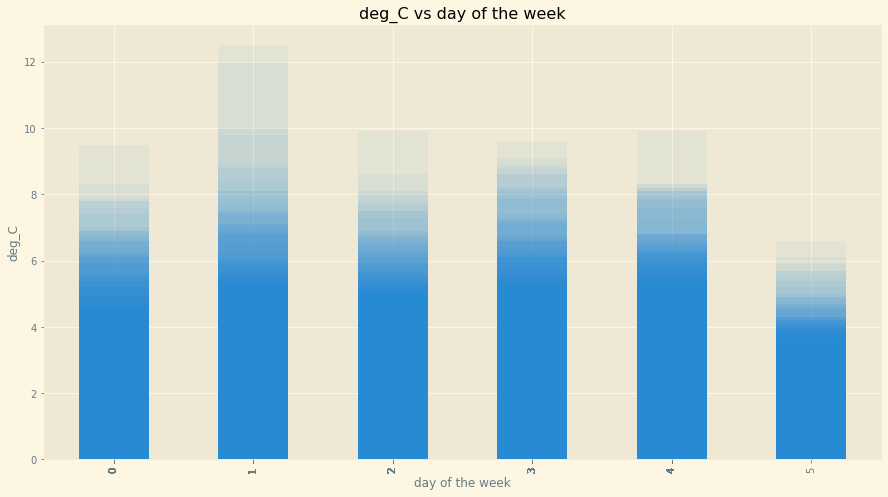

In [65]:
viz.plot_ts_bar_groupby(
    train_df, 
    ts_index_feature="dayofweek",
    groupby_feature="weekofyear",
    value_feature="target_carbon_monoxide",
    title="deg_C vs day of the week",
    xlabel="day of the week",
    ylabel="deg_C"
)

### Seasonality for target_benzene

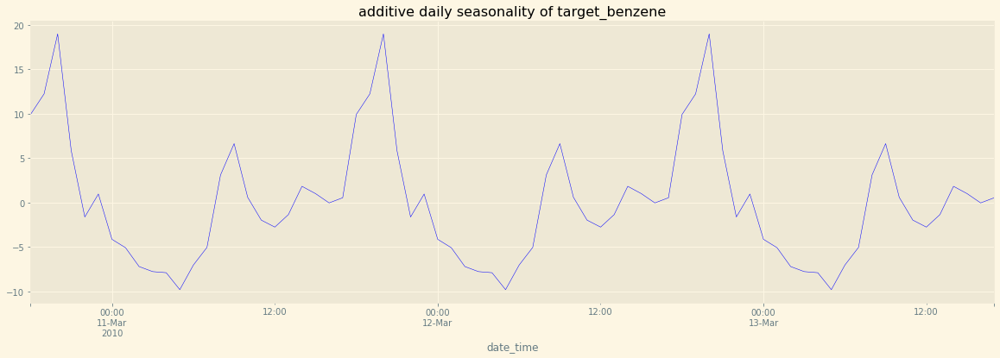

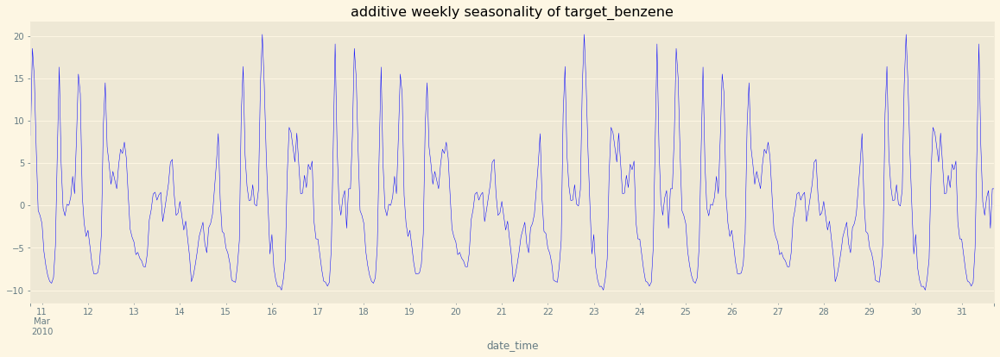

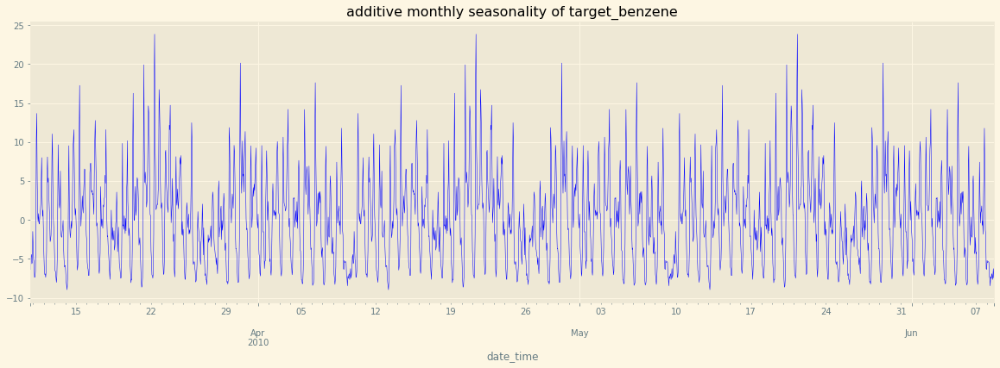

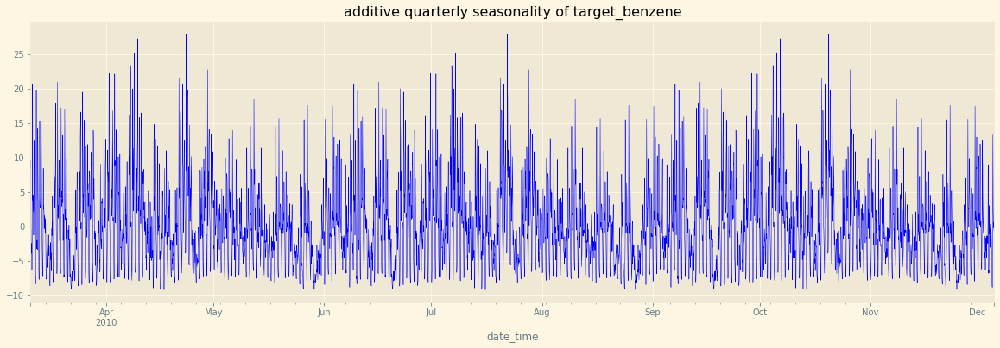

In [66]:
viz.plot_multiple_seasonalities(train_df, feature_name="target_benzene")

For target_benzene, daily, weekly and quarterly seasonalities are evident. I am little confused about monthly. But it looks like there are two periodic dips around 11th and 27th of every month.

### Seasonality for target_nitrogen_oxides

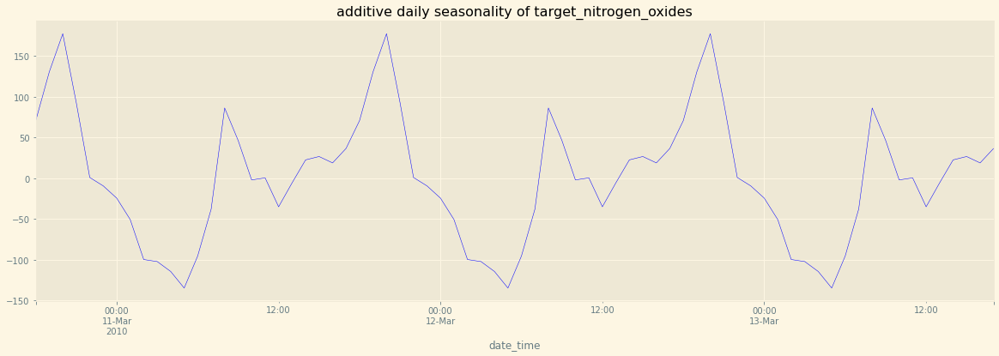

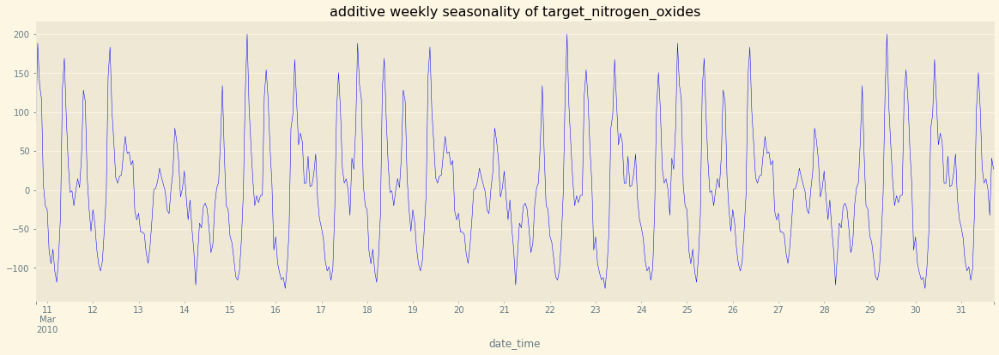

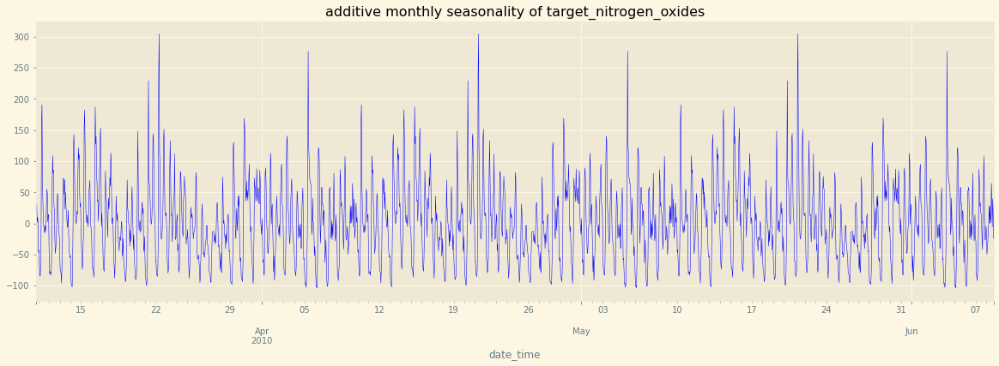

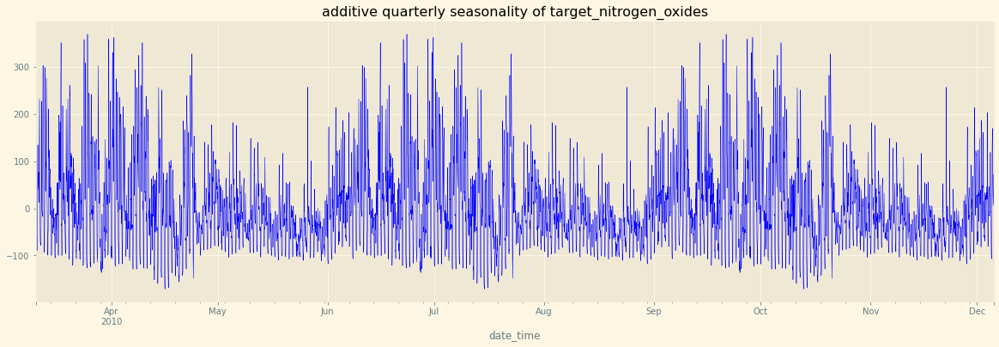

In [67]:
viz.plot_multiple_seasonalities(train_df, feature_name="target_nitrogen_oxides")

For target_nitrogen_oxides, daily, weekly and quarterly seasonalities are evident. For monthly seasonality, it looks like there are two periodic dips (by-weekly?)

### Box Plots to understand distribution across different time periods

In [68]:
train_df = ts.create_us_season(train_df, train_df, feature_name="date_time")
train_df = ts.create_date_features(train_df, train_df, feature_name="date_time")

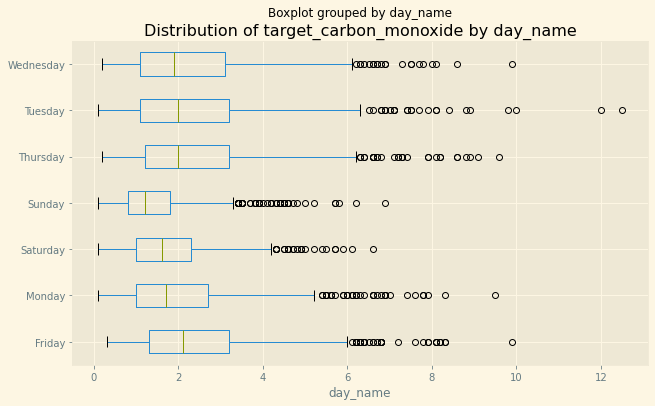

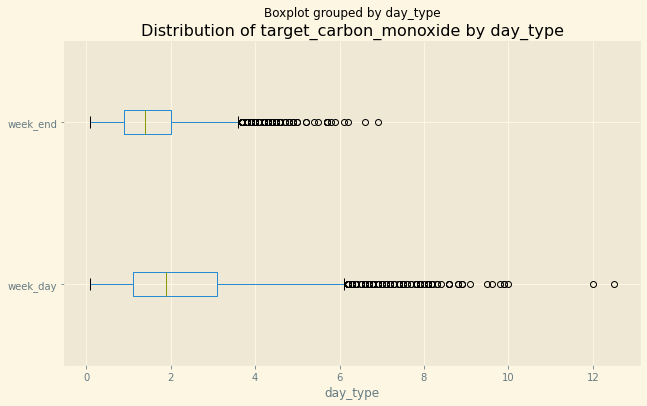

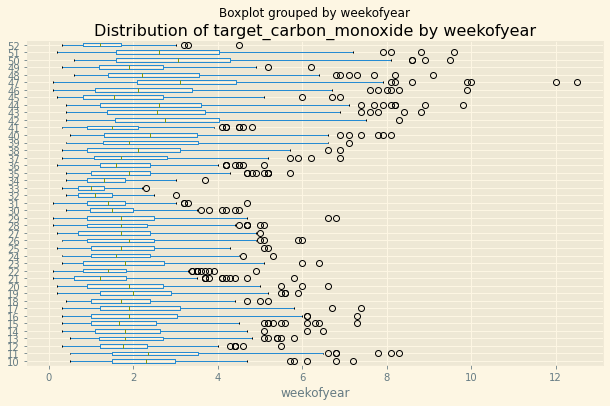

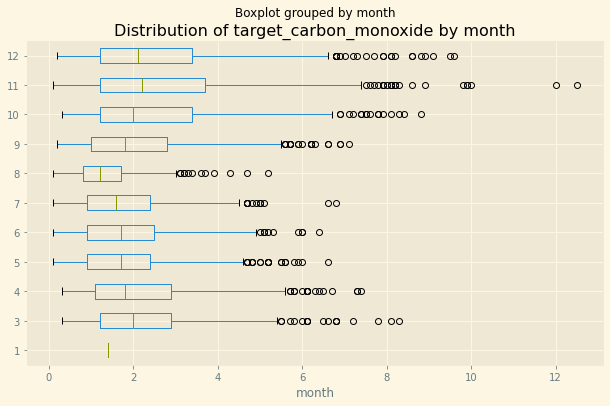

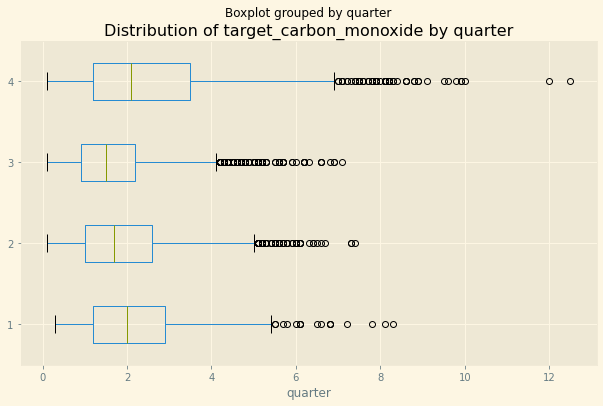

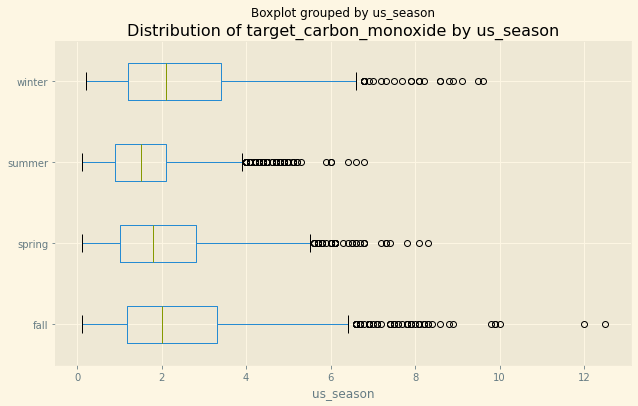

In [69]:
viz.plot_boxh_groupby(df=train_df, feature_name="target_carbon_monoxide", by="day_name")
viz.plot_boxh_groupby(df=train_df, feature_name="target_carbon_monoxide", by="day_type")
viz.plot_boxh_groupby(df=train_df, feature_name="target_carbon_monoxide", by="weekofyear")
viz.plot_boxh_groupby(df=train_df, feature_name="target_carbon_monoxide", by="month")
viz.plot_boxh_groupby(df=train_df, feature_name="target_carbon_monoxide", by="quarter")
viz.plot_boxh_groupby(df=train_df, feature_name="target_carbon_monoxide", by="us_season")

### Distribution of target variables

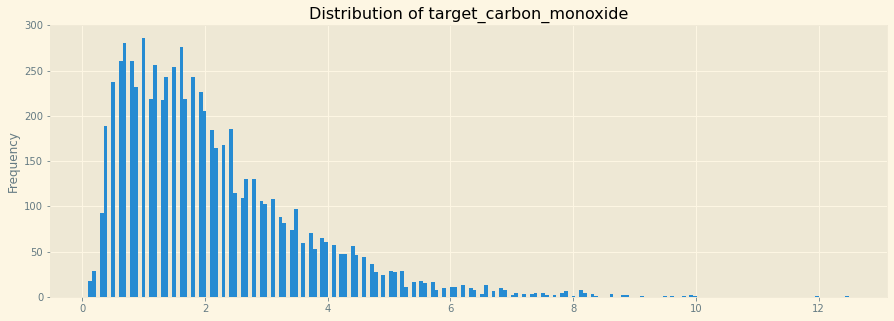

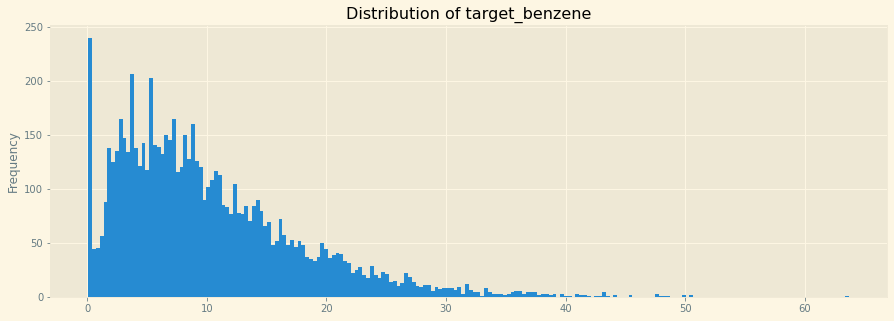

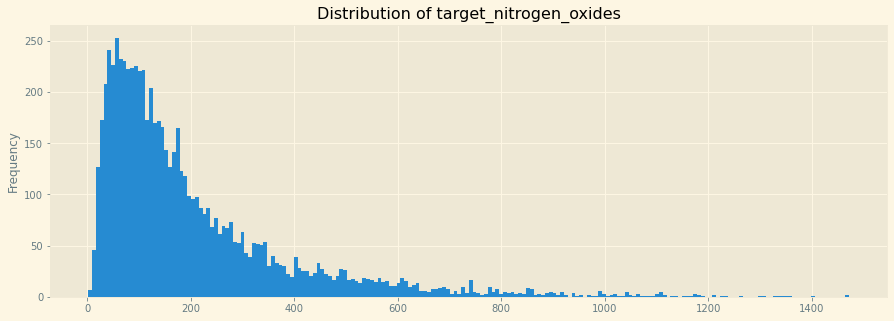

In [73]:
for name in targets:
    viz.plot_hist(df=train_df, feature_name=name, bins=200, log=False)

### Distribution of target variables (log scale)

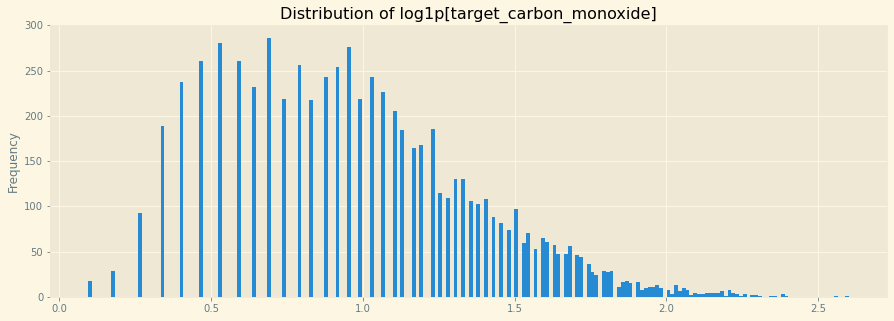

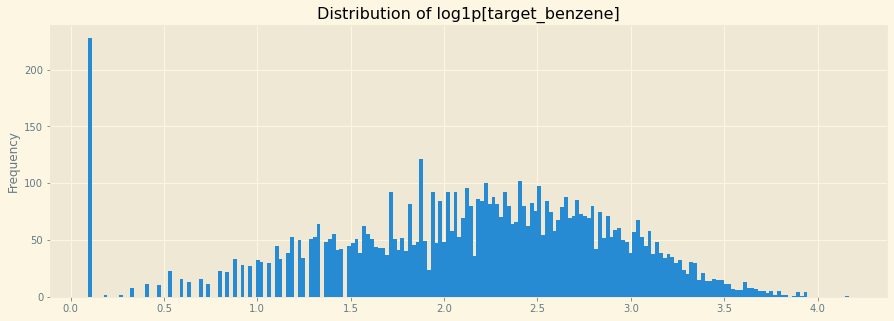

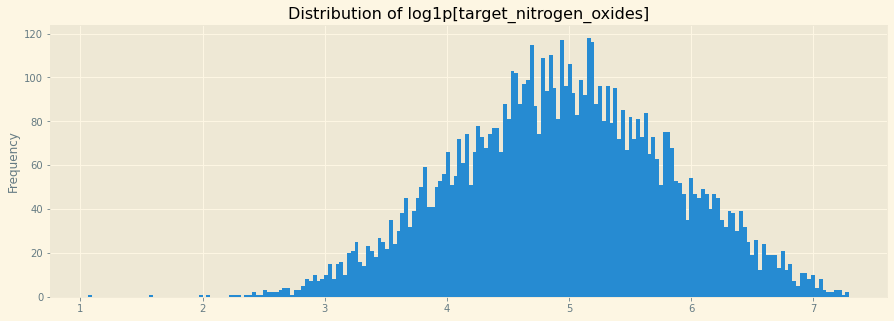

In [74]:
for name in targets:
    viz.plot_hist(df=train_df, feature_name=name, bins=200, log=True)

### Distribution of predictors (Normal Scale)

In [80]:
predictors = ['deg_C', 'relative_humidity', 'absolute_humidity',
       'sensor_1', 'sensor_2', 'sensor_3', 'sensor_4', 'sensor_5',]

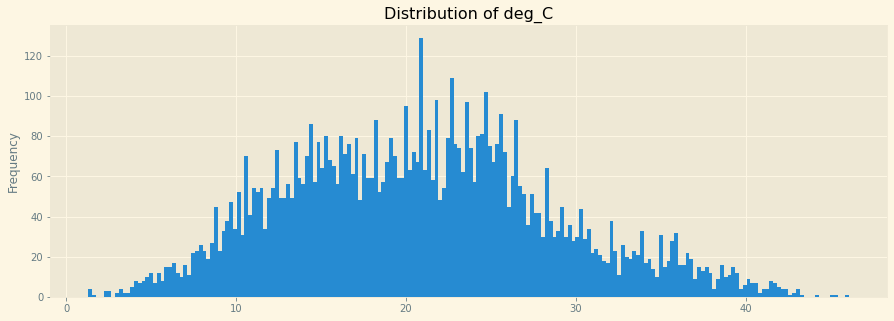

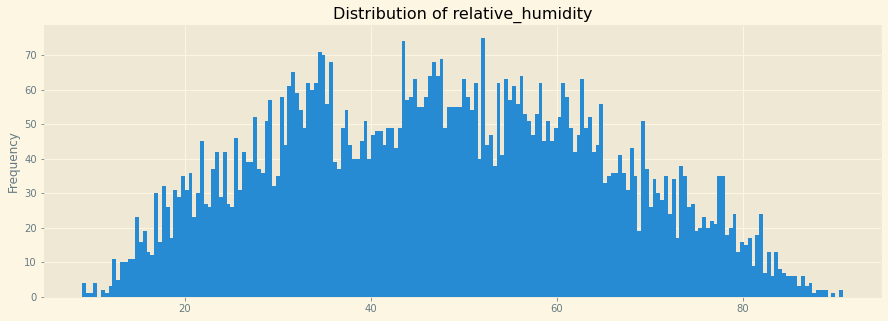

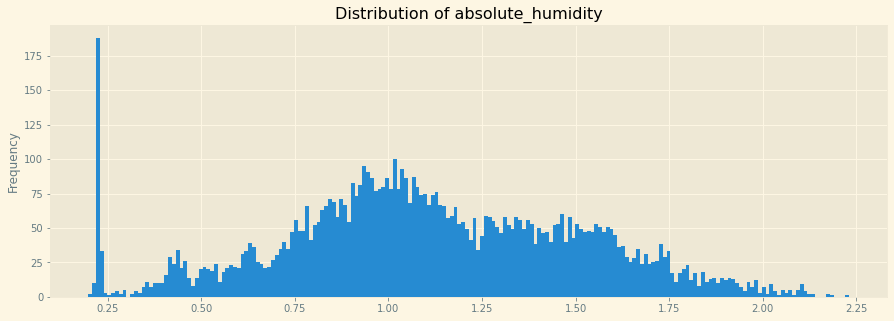

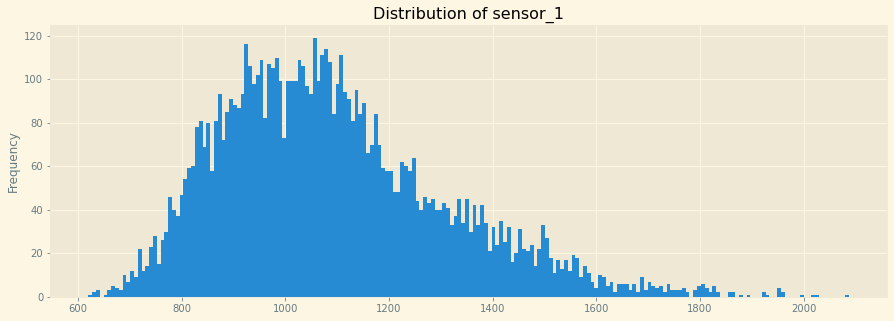

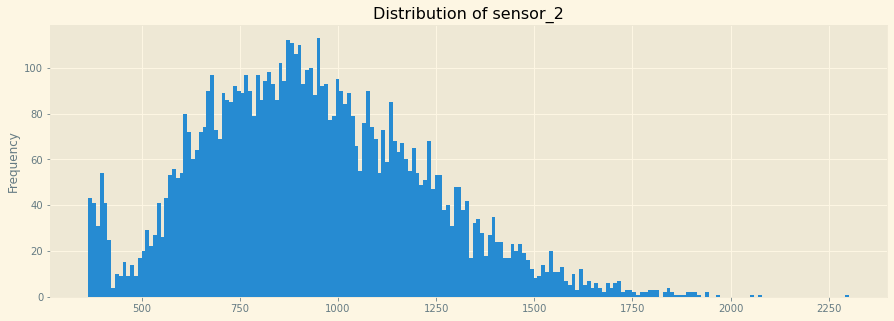

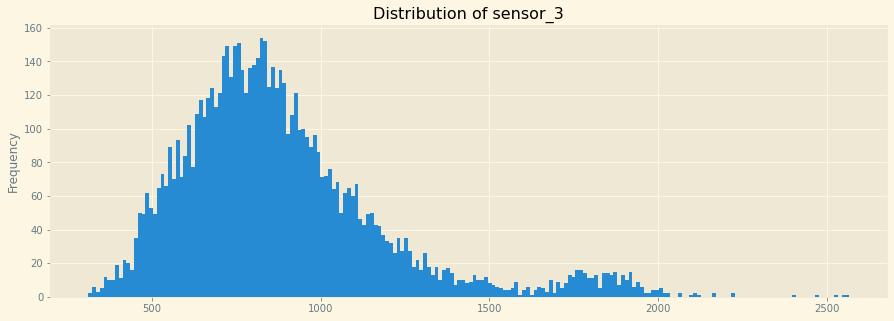

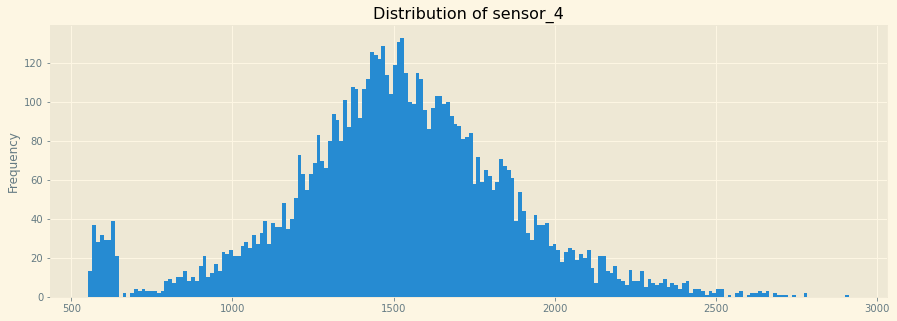

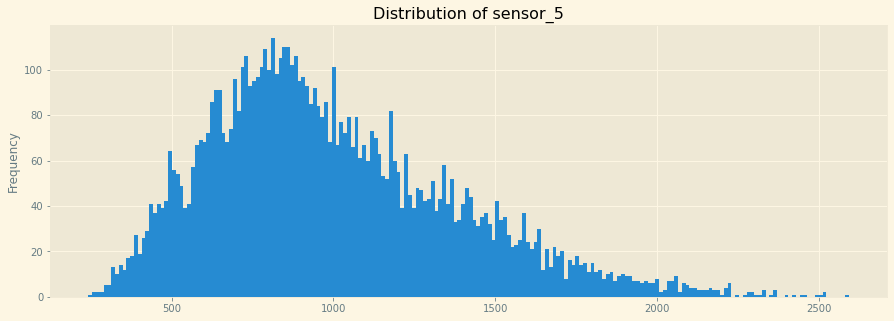

In [81]:
for name in predictors:
    viz.plot_hist(df=train_df, feature_name=name, bins=200, log=False)

### Distribution of predictors (Log Scale)

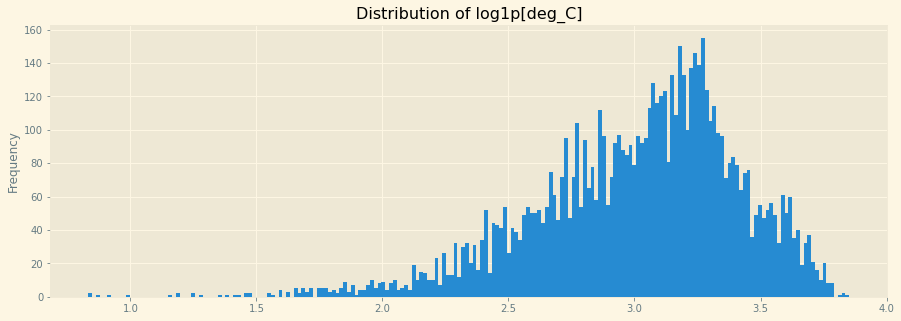

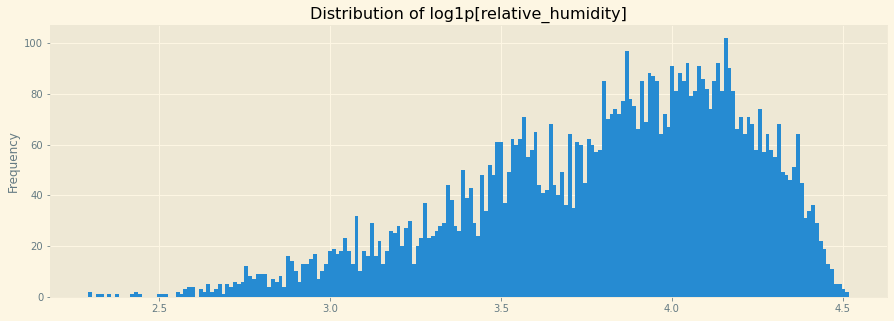

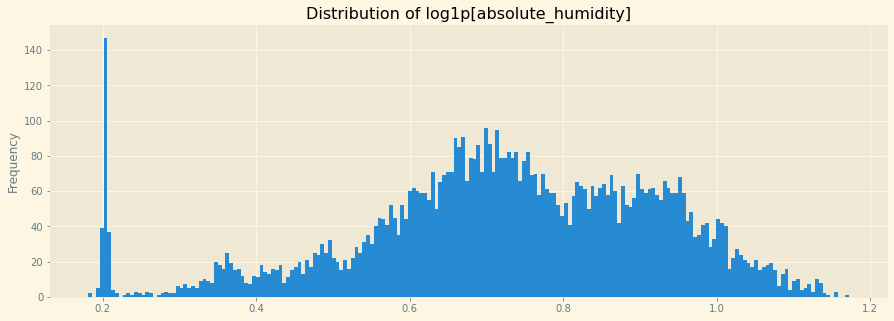

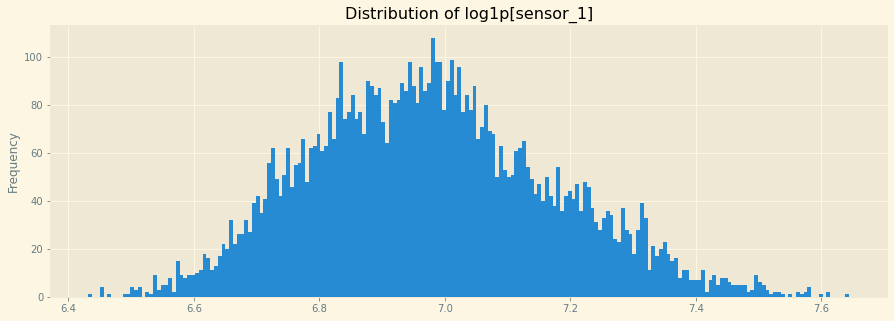

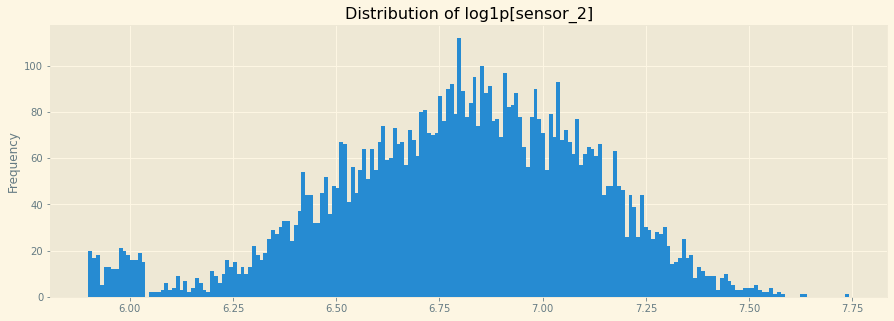

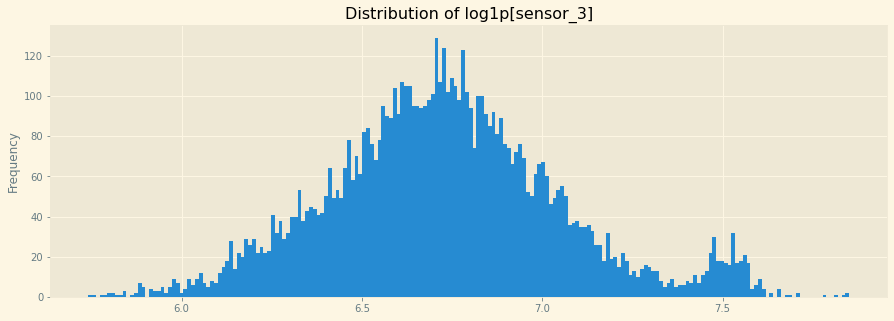

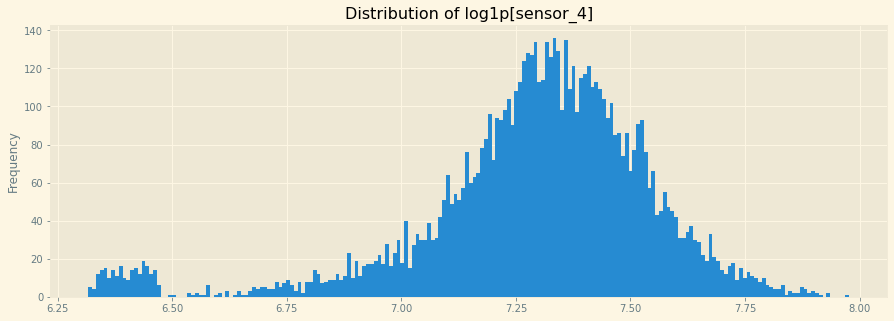

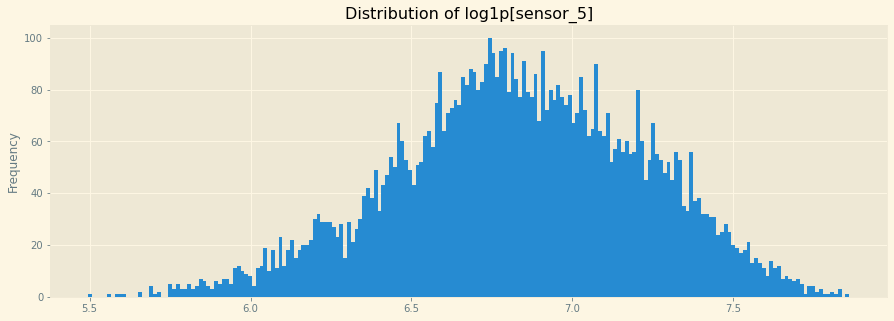

In [82]:
for name in predictors:
    viz.plot_hist(df=train_df, feature_name=name, bins=200, log=True)